# Caricamento del dataset
Fase preliminare che ha come obiettivo quello di analizzare le colonne del dataset e preparare i dati per le sezioni successive.

Nello specifico:

*   Stampo alcune righe al fine di controllare i valori al suo interno
*   Analizzo i tipi all'interno del dataset per scovare eventuali *colonne  
nulle*
*   Applico le modifiche necessarie e passo alla fase successiva

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Carico il dataset e lo metto dentro ad un dataframe

In [ ]:
bc_dataframe = pd.read_csv('/content/data.csv')

Esploro il dataset per scoprire alcune informazioni generali relative al dataset come il campo **target** e le sue **features**.

Inoltre andiamo alla ricerca di eventuali valori nulli o colonne nulle.



In [ ]:
# stampo la head del dataset per controllare le colonne
bc_dataframe.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


Trovo una colonna nulla (colonna 32).

In [ ]:
# analisi dei tipi del dataset, notiamo un campo 'unnamed'
bc_dataframe.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

<Figure size 1000x600 with 0 Axes>

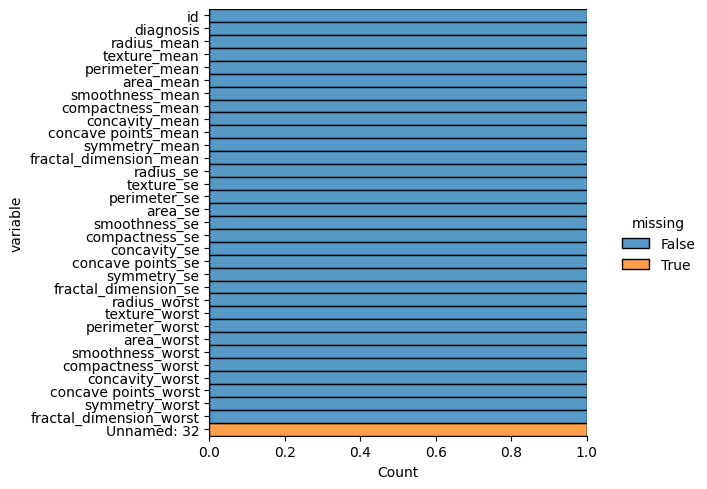

In [ ]:
plt.figure(figsize=(10,6))
sns.displot(
    data=bc_dataframe.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)

Eliminiamo l'ultima e la prima colonna dal dataframe e stampiamo le nuove colonne.

In [ ]:
# droppo la colonna 32 e controllo nuovamente le colonne
bc_dataframe = bc_dataframe.drop(columns=bc_dataframe.columns[32], inplace=False)
bc_dataframe = bc_dataframe.drop(columns=bc_dataframe.columns[0], inplace=False)

bc_dataframe.dtypes

diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

# Analisi esplorativa

La scopo della fase di **analisi esplorativa** (o EDA) è di studiare in modo più approfondito il dataset di riferimento, in questo caso si è scelto di analizzare:

1. La distribuzione della variabile target **diagnosis**
2. La distribuzioni dei diversi gruppi di feature (_mean, _se, _worst) rispetto al target attraverso dei **boxplot**
3. La matrice di correlazione tra le feature presenti nel dataset
4. Dalla matrice di correlazione, l'analisi dei grafici di variabili **positivamente** e **negativamente** correlate

In [ ]:
import numpy as np

## Distribuzione del target

Analizzare la distribuzione di un dataset è importante e va contestualizzata al tipo di studio che si sta facendo; poiché in alcuni casi i modelli potrebbero essere influenzati da un target predominante.

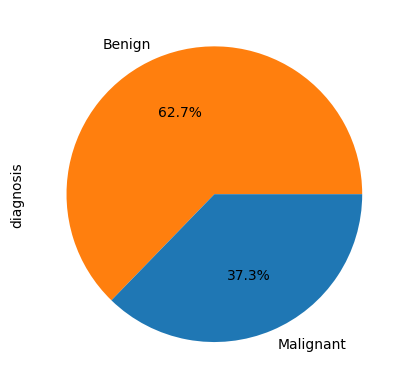

In [ ]:
# pie chart per controllare la distribuzione del target 'diagnosis'
bc_dataframe['diagnosis'].value_counts().plot(kind='pie', labels = ["Benign", "Malignant"], autopct='%1.1f%%', colors=['#ff7f0e', '#1f77b4'] )
plt.show()

Prima di analizzare i boxplot di ogni caratteristica (_mean, _se e _worst) rispetto al **target** andiamo a verificare i valori presenti all'interno del dataset per ogni colonna.

Questo può ritornare utile per stimare il valore degli outlier o per fare una prima analisi dei valori delle **features**.

In [ ]:
bc_dataframe['area_mean'].describe()

count     569.000000
mean      654.889104
std       351.914129
min       143.500000
25%       420.300000
50%       551.100000
75%       782.700000
max      2501.000000
Name: area_mean, dtype: float64

## Considerazioni sui boxplot

* In presenza di una diagnosi "**Malignant**" i valori di tutti i tipi di feature tendono a essere più grandi del caso opposto.
* Mi permette di stimare gli **outliers** presenti in ogni gruppo di feature.


<ipython-input-21-d1aeef2cd0b7>:5: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  stand_bc_dataframe = (bc_mean_data_frame - bc_mean_data_frame.mean(numeric_only=True)) / (bc_mean_data_frame.std())


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'area_mean'),
  Text(1, 0, 'compactness_mean'),
  Text(2, 0, 'concave points_mean'),
  Text(3, 0, 'concavity_mean'),
  Text(4, 0, 'fractal_dimension_mean'),
  Text(5, 0, 'perimeter_mean'),
  Text(6, 0, 'radius_mean'),
  Text(7, 0, 'smoothness_mean'),
  Text(8, 0, 'symmetry_mean'),
  Text(9, 0, 'texture_mean')])

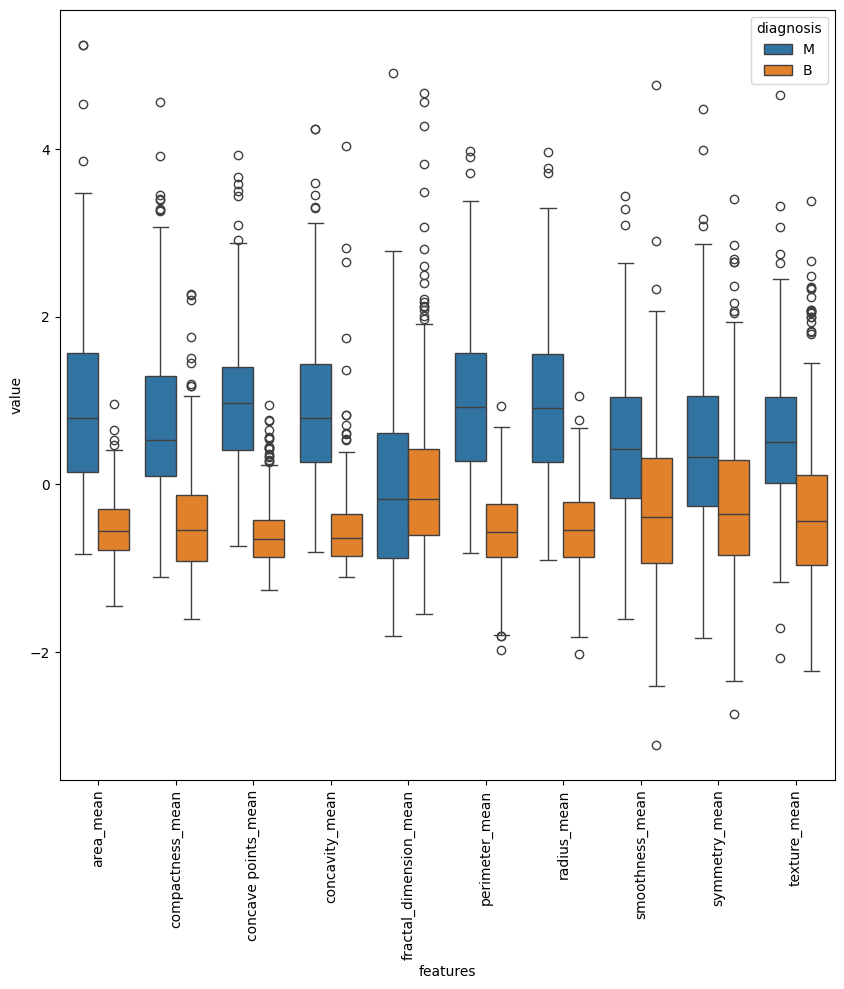

In [ ]:
# dataset in cui saranno presenti solo le feature "_mean"
bc_mean_data_frame = bc_dataframe

# standardizzo il dataset per visualizzare meglio il dataset
stand_bc_dataframe = (bc_mean_data_frame - bc_mean_data_frame.mean(numeric_only=True)) / (bc_mean_data_frame.std())

# concateno il target e le feature "_mean" e "melto" il dataset per visualizzare meglio il plot
bc_mean_data_frame = pd.concat([bc_dataframe.diagnosis, stand_bc_dataframe.filter(like='_mean')], axis = 1)
bc_mean_data_frame = pd.melt(bc_mean_data_frame,
                             id_vars = "diagnosis",
                            var_name="features",
                            value_name='value')
plt.figure(figsize=(10,10))
sns.boxplot(x="features", y="value", hue="diagnosis", data=bc_mean_data_frame)
plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'area_se'),
  Text(1, 0, 'compactness_se'),
  Text(2, 0, 'concave points_se'),
  Text(3, 0, 'concavity_se'),
  Text(4, 0, 'fractal_dimension_se'),
  Text(5, 0, 'perimeter_se'),
  Text(6, 0, 'radius_se'),
  Text(7, 0, 'smoothness_se'),
  Text(8, 0, 'symmetry_se'),
  Text(9, 0, 'texture_se')])

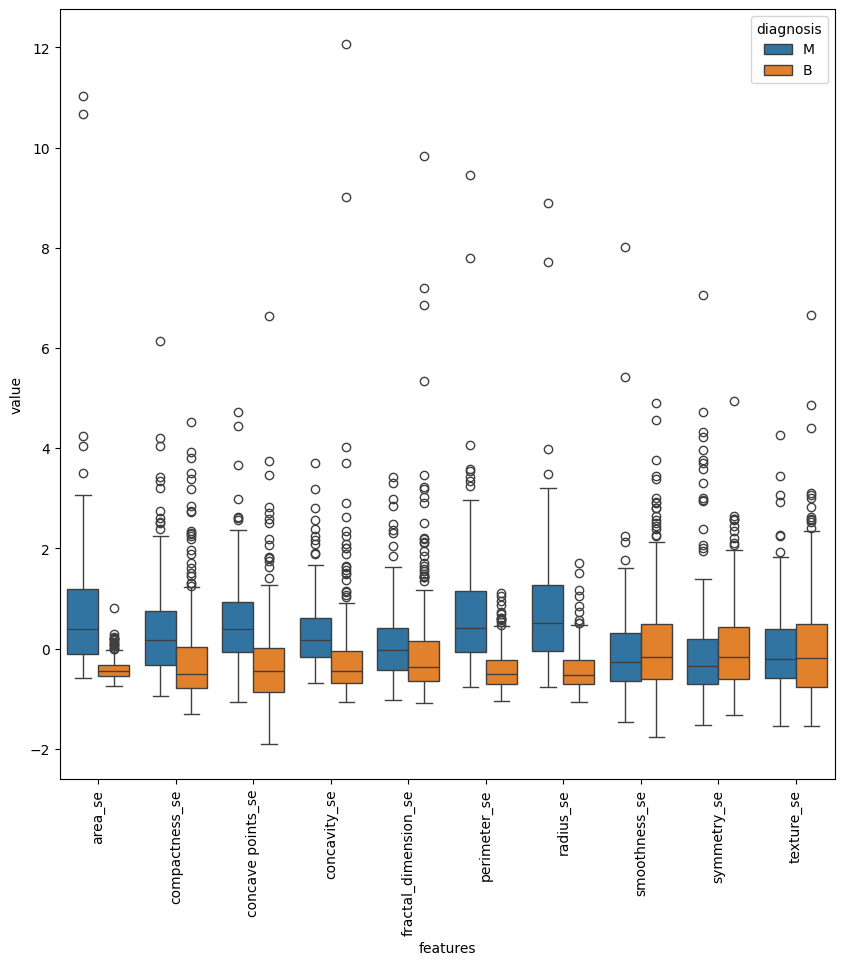

In [ ]:
# concateno il target e le feature "_se" e "melto" il dataset per visualizzare meglio il plot
bc_SE_data_frame = pd.concat([bc_dataframe.diagnosis, stand_bc_dataframe.filter(like='_se')], axis = 1)
bc_SE_data_frame = pd.melt(bc_SE_data_frame,
                             id_vars = "diagnosis",
                            var_name="features",
                            value_name='value')
plt.figure(figsize=(10,10))
sns.boxplot(x="features", y="value", hue="diagnosis", data=bc_SE_data_frame)
plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'area_worst'),
  Text(1, 0, 'compactness_worst'),
  Text(2, 0, 'concave points_worst'),
  Text(3, 0, 'concavity_worst'),
  Text(4, 0, 'fractal_dimension_worst'),
  Text(5, 0, 'perimeter_worst'),
  Text(6, 0, 'radius_worst'),
  Text(7, 0, 'smoothness_worst'),
  Text(8, 0, 'symmetry_worst'),
  Text(9, 0, 'texture_worst')])

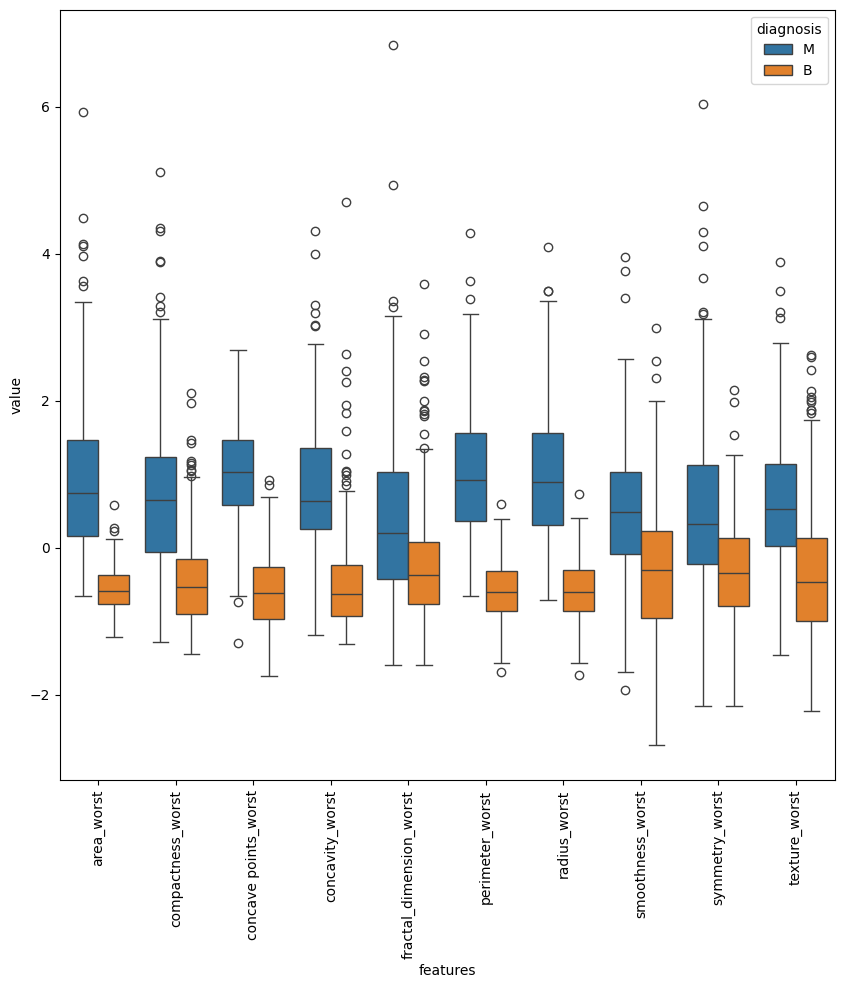

In [ ]:
# concateno il target e le feature "_worst" e "melto" il dataset per visualizzare meglio il plot
bc_worst_data_frame = pd.concat([bc_dataframe.diagnosis, stand_bc_dataframe.filter(like='_worst')], axis = 1)
bc_worst_data_frame = pd.melt(bc_worst_data_frame,
                             id_vars = "diagnosis",
                            var_name="features",
                            value_name='value')
plt.figure(figsize=(10,10))
sns.boxplot(x="features", y="value", hue="diagnosis", data=bc_worst_data_frame)
plt.xticks(rotation=90)

## Matrice di correlazione

Studiamo la correlazione tra le variabili per indiviare alcuni pattern e per capire la relazione che intercorre tra coppie di variabili.


<Axes: title={'center': 'Mappa delle correlazioni'}>

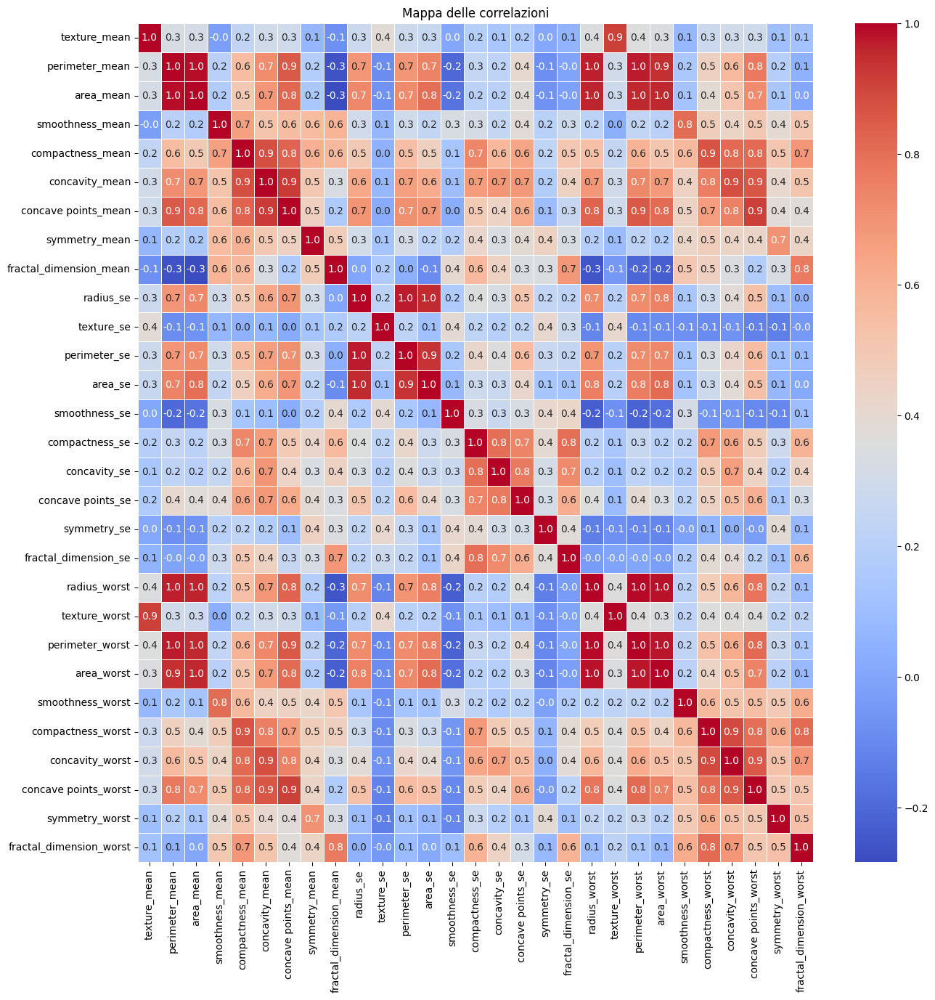

In [ ]:
# Creo la matrice di correlazione escludendo le prime due colonne del dataset
corr_matrix = bc_dataframe.iloc[:, 2:].corr()
plt.figure(figsize=(15,15))
plt.title('Mappa delle correlazioni')

sns.heatmap(corr_matrix,    # dati
            annot=True,     # mostra in chiaro il valore di ogni correlazione
            linewidths=.5,
            fmt= '.1f',
            cmap='coolwarm')

Mappa delle variabili più correlate, è stata creata per avere una migliore visualizzazione sulle coppie di variabili che possiamo prendere in esame

{'perimeter_se', 'concave points_worst', 'texture_worst', 'area_worst', 'concave points_mean', 'radius_worst', 'perimeter_worst', 'area_se', 'area_mean'}


<ipython-input-25-742003c6f7f5>:18: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  high_corr_data = bc_dataframe[high_correlated_features]
<ipython-input-25-742003c6f7f5>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_corr_data['diagnosis'] = bc_dataframe['diagnosis']
<ipython-input-25-742003c6f7f5>:22: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  high_corr_matrix = high_corr_data.corr()


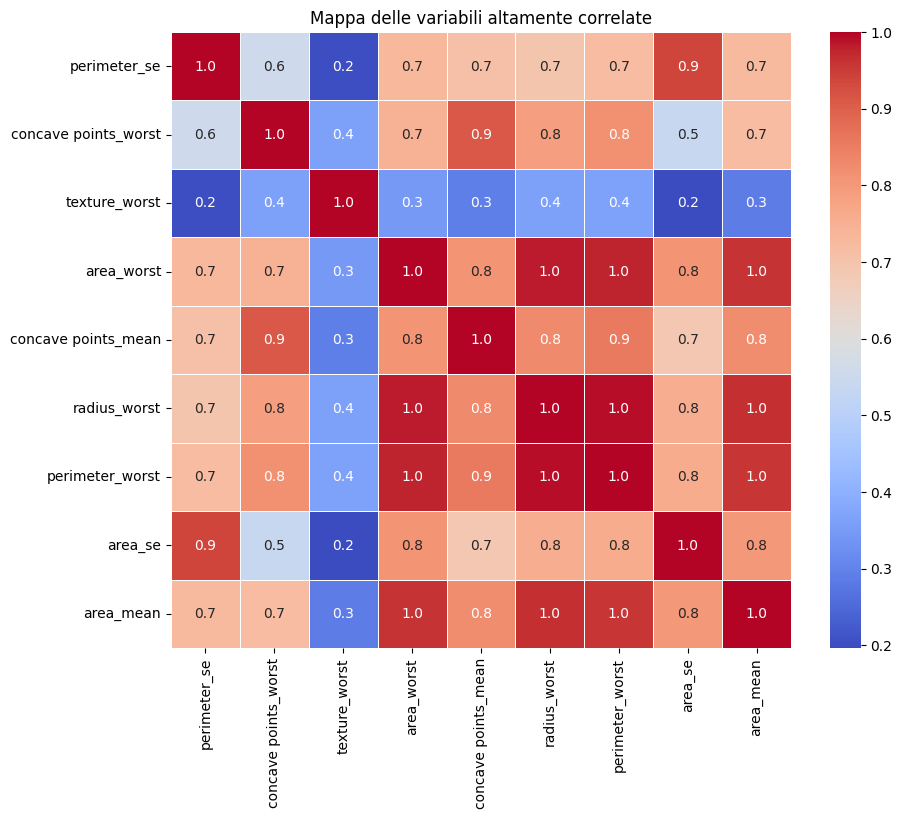

In [ ]:
threshold = 0.9

# Questo metodo estrae le features con un grado di correlazione alto, il grado di
# correlazione viene definito attraverso un treshold
def extract_high_correlated_features(corr_matrix, threshold):
  high_correlated = set()
  for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            high_correlated.add(colname)
  print(high_correlated)
  return high_correlated

# con le features estratte creiamo un altro dataset partendo dall'originale per
# costruire la mappa delle correlazione
high_correlated_features = extract_high_correlated_features(corr_matrix, threshold)
high_corr_data = bc_dataframe[high_correlated_features]
high_corr_data['diagnosis'] = bc_dataframe['diagnosis']

# Calcolo la matrice delle correlazioni
high_corr_matrix = high_corr_data.corr()

# Plotto la heatmap delle variabili con un grado di correlazione alto
plt.figure(figsize=(10, 8))
#sns.clustermap(high_corr_matrix, cmap='coolwarm', linewidths=.5, fmt= '.1f', annot = True)
sns.heatmap(high_corr_matrix,    # dati
            annot=True,     # mostra in chiaro il valore di ogni correlazione
            linewidths=.5,
            fmt= '.1f',
            cmap='coolwarm')
plt.title('Mappa delle variabili altamente correlate')
plt.show()

## Grafico delle correlazioni di ogni caratteristica
Plottiamo il grafico di ogni caratteristica per visualizzare eventuali pattern e per studiare meglio ogni caratteristica

In [ ]:
def corr(x, y, **kwargs):
    # Calcolo il coefficiente di correlazione tra le coppie di variabili
    coef = np.corrcoef(x, y)[0][1]
    # Creo la label
    label = r'$\rho$ = ' + str(round(coef, 2))

    # Store correlation value in a dictionary
    corr_values[(x.name, y.name)] = coef

    # Aggiungo la label al plot
    ax = plt.gca()
    ax.annotate(label, xy=(0.2, 0.95), size=17, xycoords=ax.transAxes)

# Initialize a dictionary to store correlation values
corr_values = {}

# Queste variabili contengono una lista contenente i nomi di tutte le variabili suddivise per le 3 caratteristiche
# Mean, SE, Worst.
m_col = ['diagnosis','radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

s_col = ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']

w_col = ['diagnosis','radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

Correlazioni tra le variabili "Mean"

<Figure size 1000x1000 with 0 Axes>

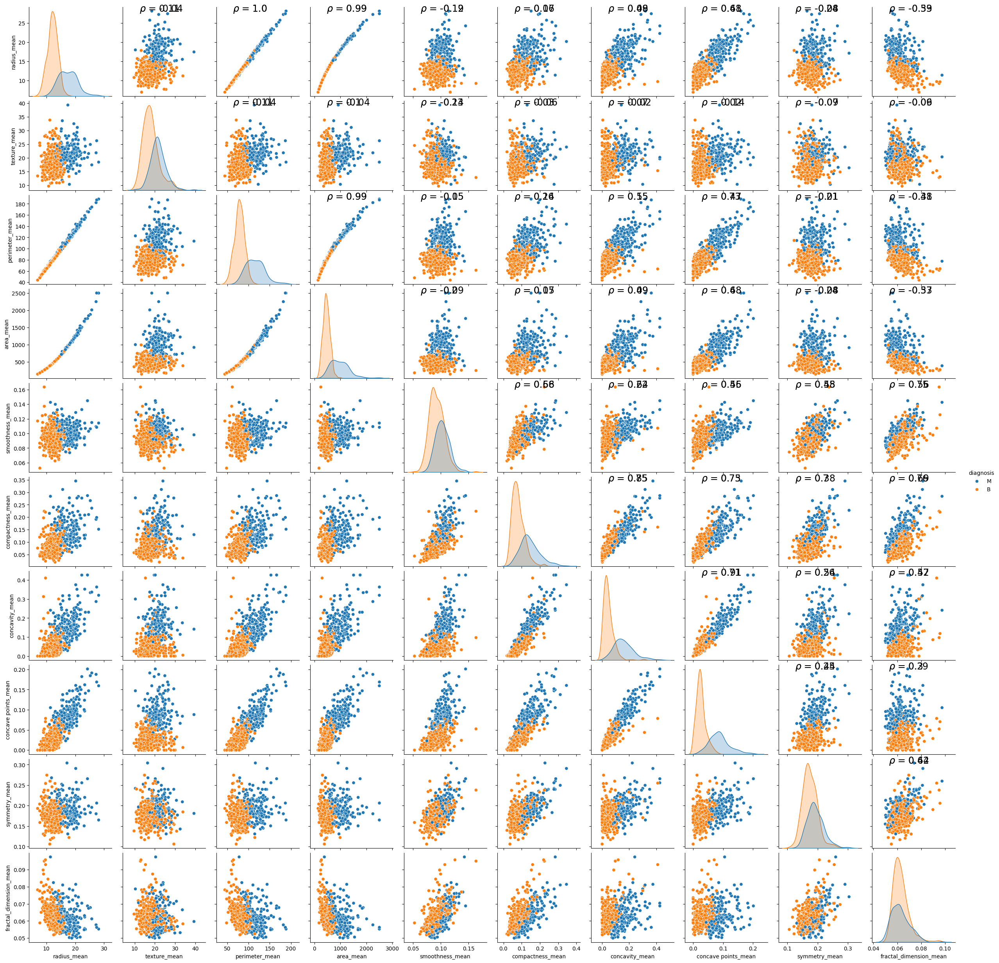

In [ ]:
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=bc_dataframe[m_col],kind ="scatter",hue="diagnosis")
grid = grid.map_upper(corr)

Correlazioni tra le variabili "SE"

<Figure size 1000x1000 with 0 Axes>

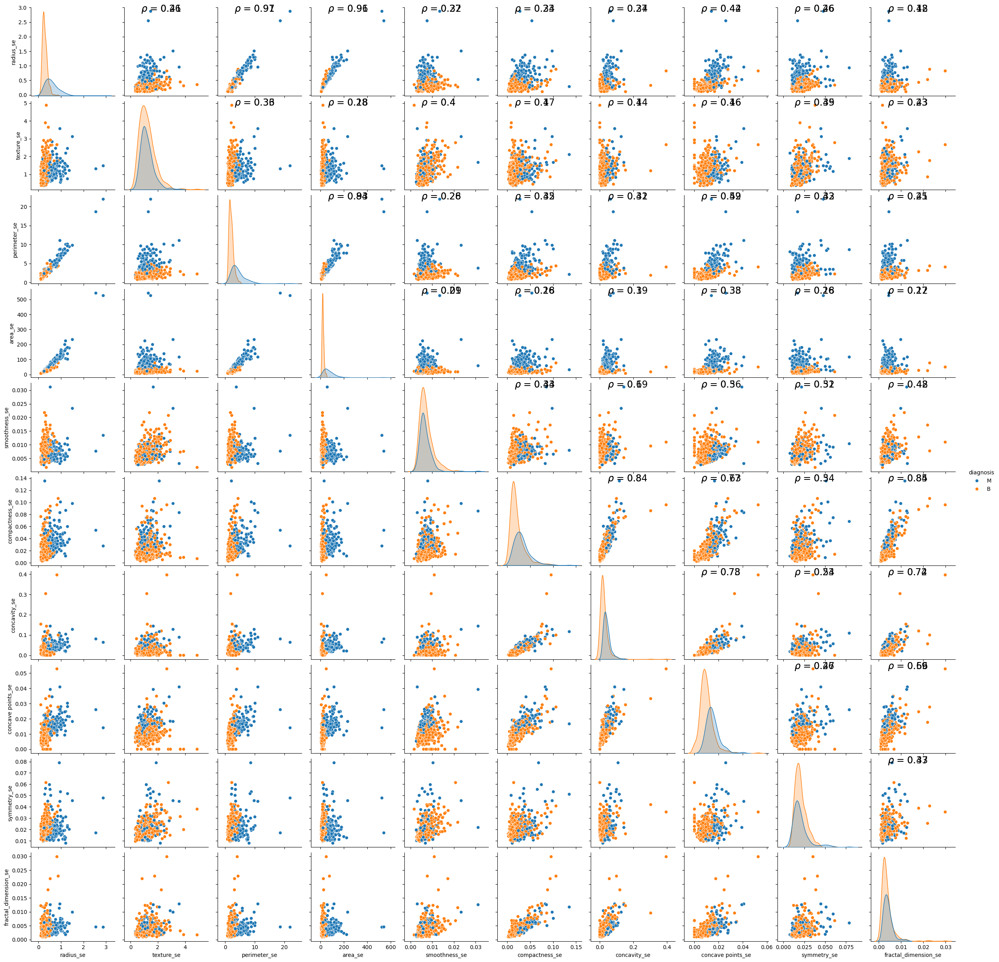

In [ ]:
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=bc_dataframe[s_col],kind ="scatter",hue="diagnosis")
grid = grid.map_upper(corr)

Correlazioni tra le variabili "Worst"

<Figure size 1000x1000 with 0 Axes>

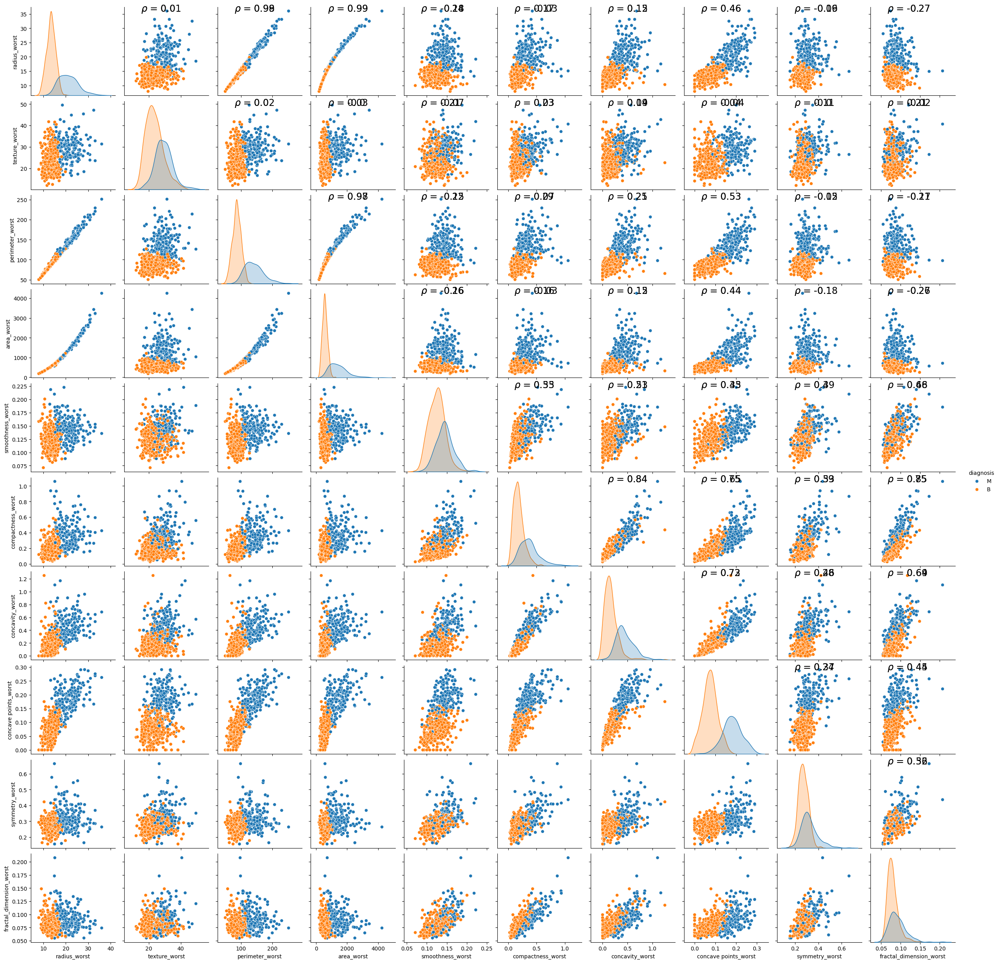

In [ ]:
plt.figure(figsize=(10,10))
grid=sns.pairplot(data=bc_dataframe[w_col],kind ="scatter",hue="diagnosis")
grid = grid.map_upper(corr)

Per analizzare più facilmente il significato di variabili positivamente, negativamente o non correlate andiamo a prendere un paio di esempi ciascuno.

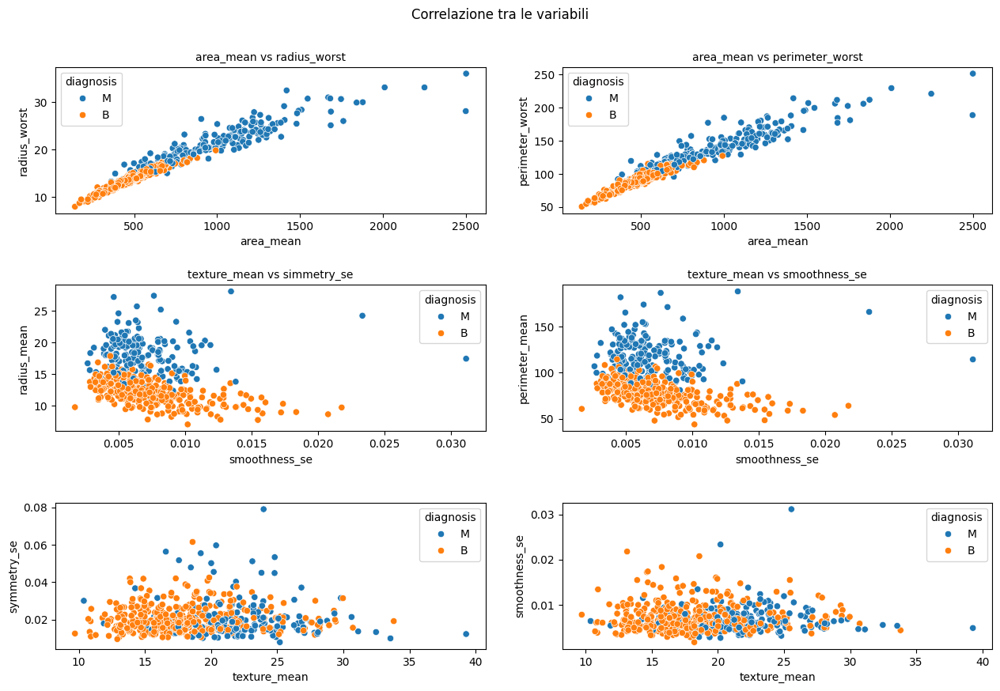

In [ ]:
# Definisco la figura e i suoi assi per plottare i 4 grafici (2x2)
figure, axs = plt.subplots(nrows=3, ncols=2, figsize=(13, 9))
plt.suptitle('Correlazione tra le variabili', fontsize=12)

# definiscono le variabili positivamente correlate, utilizzo
# "hue" serve per colorare i dati in base al target per ogni variabile

sns.scatterplot(data=bc_dataframe,
                x=bc_dataframe['area_mean'],  # varibile sull'asse x
                y=bc_dataframe['radius_worst'], # varibile sull'asse y
                hue='diagnosis',
                ax= axs[0,0] # asse in cui viene creato il plot
                )
axs[0,0].set_title('area_mean vs radius_worst', fontsize=10)

sns.scatterplot(data=bc_dataframe,
                x=bc_dataframe['area_mean'], # varibile sull'asse x
                y=bc_dataframe['perimeter_worst'], # varibile sull'asse y
                hue='diagnosis',
                ax = axs[0,1] # asse in cui viene creato il plot
                )
axs[0,1].set_title('area_mean vs perimeter_worst', fontsize=10)

# definiscono le variabili negativamente correlate, utilizzo
# "hue" serve per colorare i dati in base al target per ogni variabile

sns.scatterplot(data=bc_dataframe,
                x=bc_dataframe['smoothness_se'], # varibile sull'asse x
                y=bc_dataframe['radius_mean'],  # varibile sull'asse y
                hue='diagnosis',
                ax = axs[1,0] # asse in cui viene creato il plot
                )
axs[1,0].set_title('smoothness_se vs radius_mean', fontsize=10)

sns.scatterplot(data=bc_dataframe,
                x=bc_dataframe['smoothness_se'], # varibile sull'asse x
                y=bc_dataframe['perimeter_mean'],  # varibile sull'asse y
                hue='diagnosis',
                ax=axs[1,1] # asse in cui viene creato il plot
                )
axs[1,1].set_title('smoothness_se vs perimeter_mean', fontsize=10)

# definiscono le variabili senza correlazione, utilizzo
# "hue" serve per colorare i dati in base al target per ogni variabile

sns.scatterplot(data=bc_dataframe,
                x=bc_dataframe['texture_mean'], # varibile sull'asse x
                y=bc_dataframe['symmetry_se'],  # varibile sull'asse y
                hue='diagnosis',
                ax = axs[2,0] # asse in cui viene creato il plot
                )
axs[1,0].set_title('texture_mean vs simmetry_se', fontsize=10)

sns.scatterplot(data=bc_dataframe,
                x=bc_dataframe['texture_mean'], # varibile sull'asse x
                y=bc_dataframe['smoothness_se'],  # varibile sull'asse y
                hue='diagnosis',
                ax=axs[2,1] # asse in cui viene creato il plot
                )
axs[1,1].set_title('texture_mean vs smoothness_se', fontsize=10)
plt.tight_layout(pad=2)

plt.show()

# Principal Component Analysis (PCA)

 Utilizziamo la PCA per due ragioni:
1.  Stiamo utilizzando un dataset con tante variabili: utilizziamo la PCA per **ridurre il numero di variabili** ma preservare la **maggior parte delle informazioni**.
2.   La PCA è uno strumento che ci permette di migliorare le prestazioni dei modelli e aiuta a mitigare l'**overfitting** data la presenza di un numero minore di variabili.




In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [ ]:
# Creo un dataframe che prende in considerazione tutte le colonne tolta la prima
bc_final_dataframe = bc_dataframe

# Le feature partono dalla terza colonna, quindi evito le prime due e trasformo
# la colonna target in valori numerici
feature_columns_labels = bc_dataframe.columns[1:]
diagnosis_column = bc_final_dataframe['diagnosis']
bc_final_dataframe['diagnosis'].replace('B', 0, inplace=True)
bc_final_dataframe['diagnosis'].replace('M', 1, inplace=True)

In [ ]:
# Prendo solo le features e standardizzo i dati prima di applicare la PCA
x = bc_final_dataframe.loc[:, feature_columns_labels].values
x = StandardScaler().fit_transform(x)

In [ ]:
feat_cols = ['feature' + str(i) for i in range(x.shape[1])]
normalised_breast = pd.DataFrame(x, columns=feat_cols)
normalised_breast.tail()

,feature0,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature20,feature21,feature22,feature23,feature24,feature25,feature26,feature27,feature28,feature29
564,2.110995,0.721473,2.060786,2.343856,1.041842,0.219060,1.947285,2.320965,-0.312589,-0.931027,...,1.901185,0.117700,1.752563,2.015301,0.378365,-0.273318,0.664512,1.629151,-1.360158,-0.709091
565,1.704854,2.085134,1.615931,1.723842,0.102458,-0.017833,0.693043,1.263669,-0.217664,-1.058611,...,1.536720,2.047399,1.421940,1.494959,-0.691230,-0.394820,0.236573,0.733827,-0.531855,-0.973978
566,0.702284,2.045574,0.672676,0.577953,-0.840484,-0.038680,0.046588,0.105777,-0.809117,-0.895587,...,0.561361,1.374854,0.579001,0.427906,-0.809587,0.350735,0.326767,0.414069,-1.104549,-0.318409
567,1.838341,2.336457,1.982524,1.735218,1.525767,3.272144,3.296944,2.658866,2.137194,1.043695,...,1.961239,2.237926,2.303601,1.653171,1.430427,3.904848,3.197605,2.289985,1.919083,2.219635
568,-1.808401,1.221792,-1.814389,-1.347789,-3.112085,-1.150752,-1.114873,-1.261820,-0.820070,-0.561032,...,-1.410893,0.764190,-1.432735,-1.075813,-1.859019,-1.207552,-1.305831,-1.745063,-0.048138,-0.751207


In [ ]:
# numero di principal components desiderate
n_pc = 10

# Applico la PCA
pca_breast_10 = PCA(n_components=n_pc)
t_dataset= pca_breast_10.fit_transform(x)

# Creo un dataframe con le principal components
column_names = [f"feature{i}" for i in range(n_pc)]
principal_df = pd.DataFrame(data = t_dataset, columns=column_names)

print(principal_df)
# Contiene tutte le "explained variance"
var_ratio_10 = pca_breast_10.explained_variance_ratio_
print(np.sum(var_ratio_10))
print(var_ratio_10)

      feature0   feature1  feature2  feature3  feature4  feature5  feature6  \
0     9.192837   1.948583 -1.123166  3.633731 -1.195110  1.411424  2.159371   
1     2.387802  -3.768172 -0.529293  1.118264  0.621775  0.028656  0.013358   
2     5.733896  -1.075174 -0.551748  0.912083 -0.177086  0.541452 -0.668167   
3     7.122953  10.275589 -3.232790  0.152547 -2.960878  3.053422  1.429909   
4     3.935302  -1.948072  1.389767  2.940639  0.546747 -1.226495 -0.936212   
..         ...        ...       ...       ...       ...       ...       ...   
564   6.439315  -3.576817  2.459487  1.177314 -0.074824 -2.375193 -0.596131   
565   3.793382  -3.584048  2.088476 -2.506028 -0.510722 -0.246710 -0.716327   
566   1.256179  -1.902297  0.562731 -2.089227  1.809991 -0.534447 -0.192758   
567  10.374794   1.672010 -1.877029 -2.356031 -0.033742  0.567936  0.223082   
568  -5.475243  -0.670637  1.490443 -2.299157 -0.184703  1.617837  1.698952   

     feature7  feature8  feature9  
0   -0.398404 -

La misura dell'*Explained Variance* indica quanta varianza viene "spiegata" (o rappresentata) da ciascun *Principal Component*.

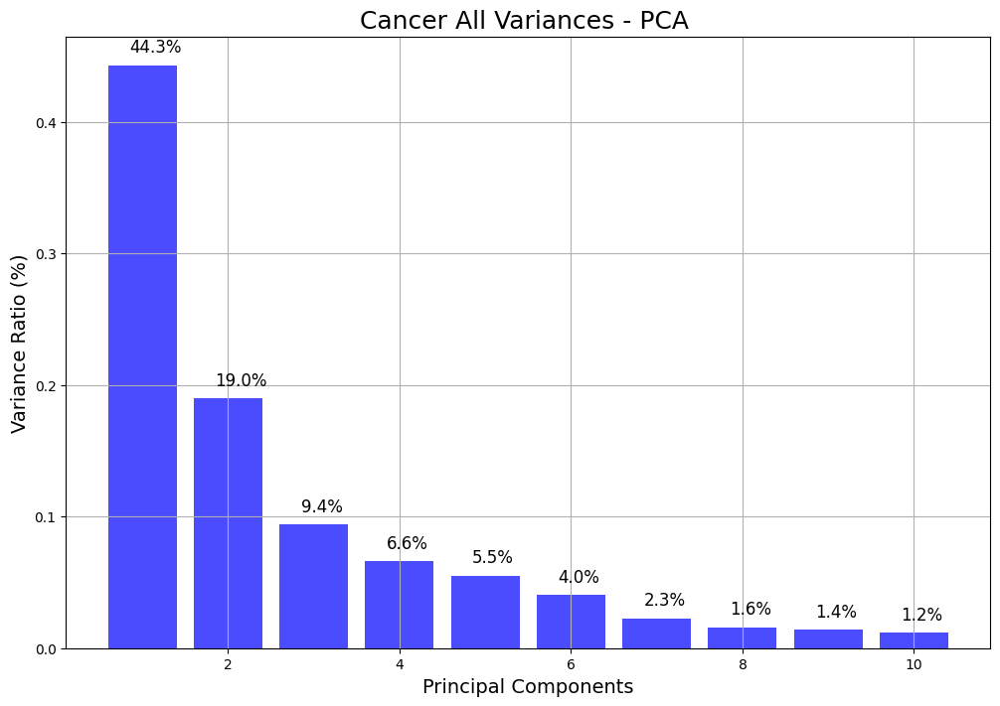

In [ ]:
# Plotto la explained variance per ogni principal component
plt.figure(figsize=(12, 8))
bars = plt.bar(range(1, len(var_ratio_10) + 1), var_ratio_10, color='blue', alpha=0.7)
plt.title('Cancer All Variances - PCA ', fontsize=18)
plt.xlabel('Principal Components', fontsize=14)
plt.ylabel('Variance Ratio (%)', fontsize=14)
plt.grid(True)

for bar, ratio in zip(bars, var_ratio_10):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, bar.get_height() + 0.01, f'{ratio:.1%}', fontsize=12)

plt.show()


In [ ]:
# copio il dataset con il numero di principal components che voglio esportare
final_dataset = principal_df.copy()
final_dataset = final_dataset.assign(diagnosis=diagnosis_column)
print(final_dataset.tail())

# creo un nuovo dataset contenente i risultati della PCA e la colonna diagnosis
final_dataset.to_csv('/content/PCA.csv')
bc_dataframe_PCA = pd.read_csv('/content/PCA.csv')

      feature0  feature1  feature2  feature3  feature4  feature5  feature6  \
564   6.439315 -3.576817  2.459487  1.177314 -0.074824 -2.375193 -0.596131   
565   3.793382 -3.584048  2.088476 -2.506028 -0.510722 -0.246710 -0.716327   
566   1.256179 -1.902297  0.562731 -2.089227  1.809991 -0.534447 -0.192758   
567  10.374794  1.672010 -1.877029 -2.356031 -0.033742  0.567936  0.223082   
568  -5.475243 -0.670637  1.490443 -2.299157 -0.184703  1.617837  1.698952   

     feature7  feature8  feature9  diagnosis  
564 -0.035475  0.987933  0.257004          1  
565 -1.113362 -0.105205 -0.108623          1  
566  0.341887  0.393916  0.520879          1  
567 -0.280237 -0.542038 -0.089309          1  
568  1.046354  0.374106 -0.047729          0  


Da questo grafico si evince che i dati tendono a formare due gruppi (o cluster) abbastanza distinti, motivo per cui possiamo utilizzare il decision tree classifier.

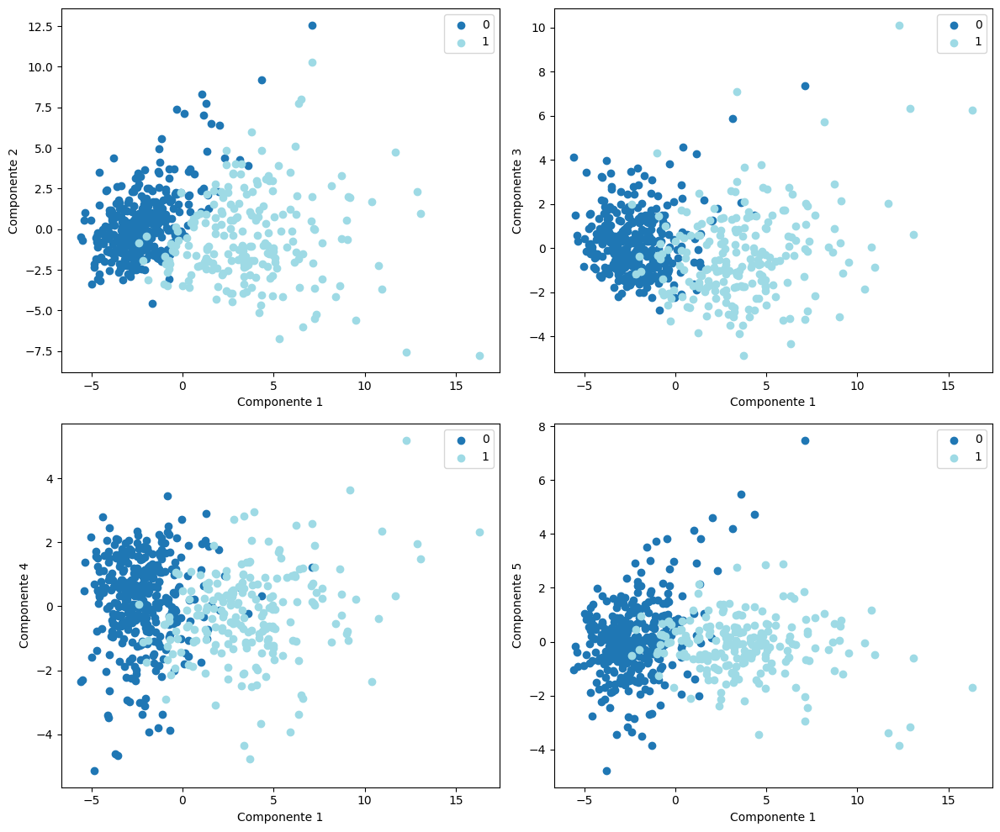

In [ ]:
xT = pca_breast_10.fit_transform(x)

# gestione delle label e dei colori
y = bc_dataframe['diagnosis']
unique_labels = np.unique(bc_dataframe['diagnosis'])
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))
label_to_color = dict(zip(unique_labels, colors))

# Creo il subplot per mettere i plot nei relativi assi
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Plot the first 4 PCs against PC1 in a 2x2 grid
for pc in range(4):
    row = pc // 2
    col = pc % 2
    ax = axes[row, col]

    for label in unique_labels:
        mask = (bc_dataframe['diagnosis'] == label).values
        ax.scatter(xT[mask, 0], xT[mask, pc + 1], color=label_to_color[label], label=label)

    ax.set_xlabel('Componente 1')
    ax.set_ylabel(f'Componente {pc + 2}')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()


Contributo delle variabili presenti nelle prime due componenti (PC1, PC2) le quali rappresenta le percentuali maggiori di **explained variance**.

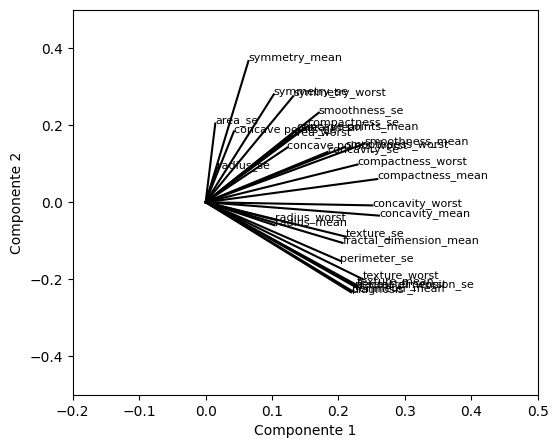

In [ ]:
pcs = pca_breast_10.components_
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim([-0.2, 0.5])
ax.set_ylim([-0.5, 0.5])
ax.set_xlabel('Componente 1')
ax.set_ylabel('Componente 2')

for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
    # plot line between origin and point (x, y)
    ax.plot([0, x], [0, y], color='k')
    # display the label of the point
    ax.text(x, y, bc_dataframe.columns[i], fontsize='8')

# Decision Tree

Al *Decision Tree* sono stati applicati due versioni dello stesso dataset, ovvero quello della PCA ma con due _Explained Variace_ differenti: per verificare quale dei due generalizza meglio i nostri dati.

Per prevenire l'overfitting è stata utilizzata una tecnica di **post pruning**, la quale verrà illustrata passo passo nel codice.

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
import scipy.stats as st
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import metrics
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus
from time import time

df = pd.read_csv('PCA.csv')

## Decision tree con 6 dimensioni (Explained Variance: 88,8%)



Preparo i dati che mi serviranno per il train e il test del _Decision Tree_.

In [ ]:
# Prendo le prime 6 feature dal dataset che ho esportato in precedenza
feature_names_1 = [col for col in df.columns if col.startswith("feature")][:6]
target_name = 'diagnosis'

# Preparo i dati per il training e per il test
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(df[feature_names_1], df[target_name], random_state=0)

clf_1 = DecisionTreeClassifier(random_state=0)
clf_1.fit(X_train_1, y_train_1)

DecisionTreeClassifier(random_state=0)

1. Calcolo il **pruning path**:

  * Il quale consiste in un insieme di valori alpha (identificati come _ccp_apha_) e le relative *impurities*.

  * Le *impurities* possono essere rappresentate da più metriche, come ad esempio il **Gini**: il quale descrive quanta "incertezza" è presente nella classe di appartenenza; una classe rappresentata da soli esempi "Benign" avrà un'incertezza pari a 0, e così via.

2. Allenamento di *Decision Tree* al variare di **ccp_alpha**
3. Plot del risultato:
  * In questo grafico è possibile notare la il **numero di nodi** e la **profondità** dell'albero al variare del **ccp_apha**.


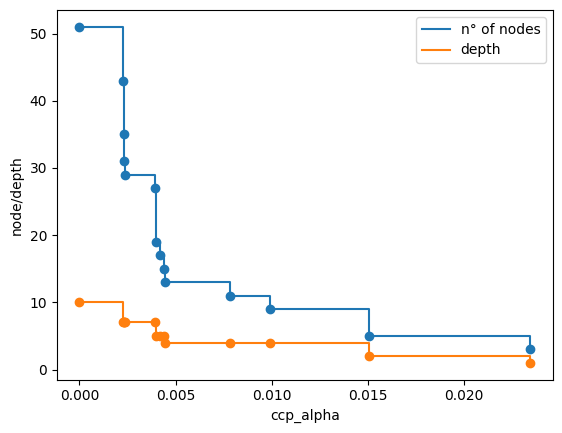

In [ ]:
# calcolo del pruning path
path_1 = clf_1.cost_complexity_pruning_path(X_train_1, y_train_1)
ccp_alphas_1, impurities_1 = path_1.ccp_alphas, path_1.impurities

# Creo una lista in cui andrò a storare la serie di classificatori
# per ogni ccp_alpha creo un classificatore, ci permette di controllare complessità
# e precisione del modello
clfs_1 = []
for ccp_alpha in ccp_alphas_1:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train_1, y_train_1)
    clfs_1.append(clf)

# Elimino l'ultimo perché a questo non viene applicato nessun pruning, quindi non
# lo consideriamo, così come il suo ccp_apha
clfs_1 = clfs_1[:-1]
ccp_alphas_1 = ccp_alphas_1[:-1]

node_counts = [clf.tree_.node_count for clf in clfs_1]
depth = [clf.tree_.max_depth for clf in clfs_1]

# Plotto il risultato
plt.scatter(ccp_alphas_1,node_counts)
plt.scatter(ccp_alphas_1,depth)
plt.plot(ccp_alphas_1,node_counts,label='n° of nodes',drawstyle="steps-post")
plt.plot(ccp_alphas_1,depth,label='depth',drawstyle="steps-post")
plt.xlabel('ccp_alpha')
plt.ylabel('node/depth')
plt.legend()
plt.show()

Valutiamo l'accuracy dei classificatori inseriti nella lista **clfs**; creo altre due liste che mi serviranno a plottare in un grafico le accuracy relative alla fase di **training e testing**.

Il plot finale ci aiuta quindi a ricavare il valore di ccp_alpha ottimale: il quale massimizza le prestazioni del modello sul set di test, di fatto mitigando l'overfitting.

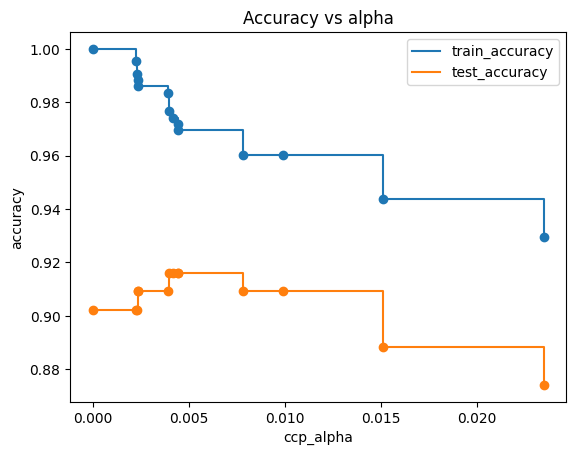

In [ ]:
# Creo due liste per la fase di "training" e la fase di "testing"
train_acc_1 = []
test_acc_1 = []

# Per ogni classificatore vado a valutare l'accuracy della fase di "training" e "testing"
for c in clfs_1:
    y_train_pred_1 = c.predict(X_train_1)
    y_test_pred_1 = c.predict(X_test_1)
    train_acc_1.append(metrics.accuracy_score(y_train_pred_1,y_train_1))
    test_acc_1.append(metrics.accuracy_score(y_test_pred_1,y_test_1))

# Plotto il risultato
plt.scatter(ccp_alphas_1,train_acc_1)
plt.scatter(ccp_alphas_1,test_acc_1)
plt.plot(ccp_alphas_1,train_acc_1,label='train_accuracy',drawstyle="steps-post")
plt.plot(ccp_alphas_1,test_acc_1,label='test_accuracy',drawstyle="steps-post")
plt.legend()
plt.title('Accuracy vs alpha')
plt.xlabel('ccp_alpha')
plt.ylabel('accuracy')
plt.show()

Una volta scelto un *alpha* che adeguato alleno nuovamente il decision tree e analizzo i risultati ottenuti.

Train score 0.9694835680751174
Test score 0.916083916083916
Tempo di training Decision Tree: 0.01 secondi


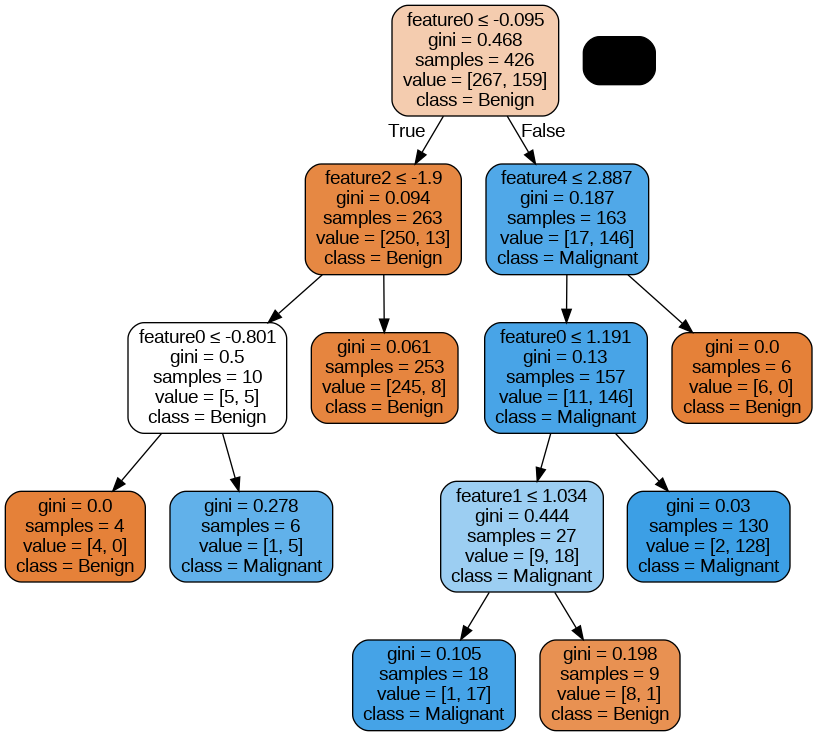

In [ ]:
start_time = time()
clf_1_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=0.005)
clf_1_.fit(X_train_1,y_train_1)
end_time = time()

y_train_pred_1 = clf_1_.predict(X_train_1)
y_test_pred_1 = clf_1_.predict(X_test_1)
dt_training_time = end_time - start_time

print(f'Train score {metrics.accuracy_score(y_train_pred_1,y_train_1)}')
print(f'Test score {metrics.accuracy_score(y_test_pred_1,y_test_1)}')
print(f'Tempo di training Decision Tree: {dt_training_time:.2f} secondi')


dot_data = export_graphviz(clf_1_, out_file=None,
                           feature_names=feature_names_1,
                           class_names=["Benign", "Malignant"],
                           filled=True, rounded=True, special_characters=True)

# Plotto il decision tree
graph = pydotplus.graph_from_dot_data(dot_data)
# Produco il decision tree e lo salvo in un'immagine PNG
graph.write_png('decision_tree_6F.png')
Image(graph.create_png())

*   Matrice di confusione
*   Precision
*   Recall
*   F1

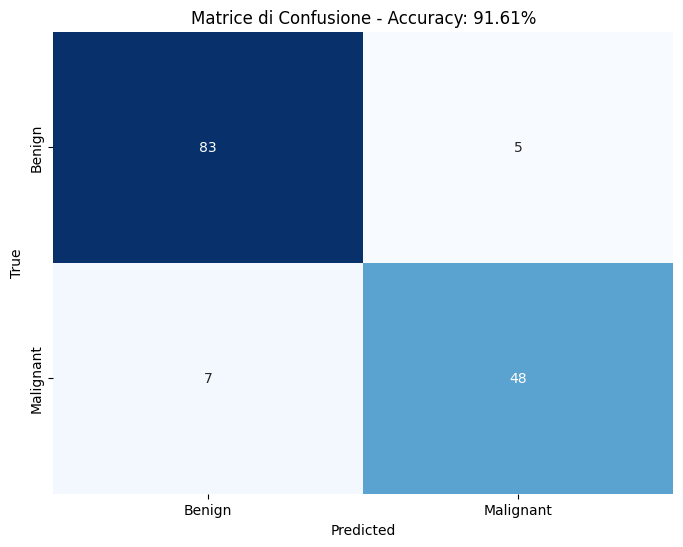

Decision tree PCA con 6 features - Precision: 0.87
Decision tree PCA con 6 features - Recall: 0.91
Decision tree PCA con 6 features - F1: 0.89
Precisione Maligna: 0.87
Precisione Benigna: 0.94
Precisione Media Macro: 0.91
Recall Maligna: 0.91
Recall Benigna: 0.92
Recall Media Macro: 0.91
Punteggio F1 Maligna: 0.89
Punteggio F1 Benigna: 0.93
Punteggio F1 Media Macro: 0.91


In [ ]:
# Creo un dataframe con la matrice di confusione
cm_1 = confusion_matrix(y_test_pred_1,y_test_1)
cm_df = pd.DataFrame(cm_1, index=["Benign", "Malignant"], columns=["Benign", "Malignant"])
accuracy = accuracy_score(y_test_1, y_test_pred_1)

# Plotto la matrice di confusione
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title(f"Matrice di Confusione - Accuracy: {accuracy*100:.2f}%")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Calcolo di Precision, Recall e F1
precision = precision_score(y_test_1, y_test_pred_1)
recall = recall_score(y_test_1, y_test_pred_1)
f1 = f1_score(y_test_1, y_test_pred_1)

# Calcolo della Precisione per ciascuna classe e media macro
precision_maligna = precision_score(y_test_1, y_test_pred_1, pos_label=1)
precision_benigna = precision_score(y_test_1, y_test_pred_1, pos_label=0)
precision_media_macro = precision_score(y_test_1, y_test_pred_1, average='macro')

# Calcolo della Recall per ciascuna classe e media macro
recall_maligna = recall_score(y_test_1, y_test_pred_1, pos_label=1)
recall_benigna = recall_score(y_test_1, y_test_pred_1, pos_label=0)
recall_media_macro = recall_score(y_test_1, y_test_pred_1, average='macro')

# Calcolo del Punteggio F1 per ciascuna classe e media macro
f1_maligna = f1_score(y_test_1, y_test_pred_1, pos_label=1)
f1_benigna = f1_score(y_test_1, y_test_pred_1, pos_label=0)
f1_media_macro = f1_score(y_test_1, y_test_pred_1, average='macro')

print(f"Decision tree PCA con 6 features - Precision: {precision:.2f}")
print(f"Decision tree PCA con 6 features - Recall: {recall:.2f}")
print(f"Decision tree PCA con 6 features - F1: {f1:.2f}")

# Stampa dei risultati
print(f"Precisione Maligna: {precision_maligna:.2f}")
print(f"Precisione Benigna: {precision_benigna:.2f}")
print(f"Precisione Media Macro: {precision_media_macro:.2f}")

print(f"Recall Maligna: {recall_maligna:.2f}")
print(f"Recall Benigna: {recall_benigna:.2f}")
print(f"Recall Media Macro: {recall_media_macro:.2f}")

print(f"Punteggio F1 Maligna: {f1_maligna:.2f}")
print(f"Punteggio F1 Benigna: {f1_benigna:.2f}")
print(f"Punteggio F1 Media Macro: {f1_media_macro:.2f}")

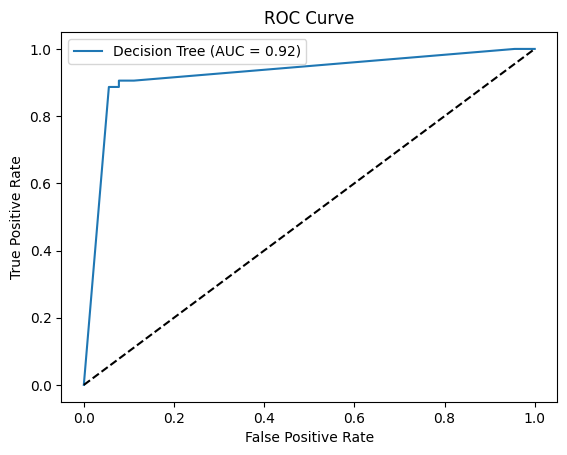

In [ ]:
y_dt_pred_prob_1 = clf_1_.predict_proba(X_test_1)[:, 1]

fpr_dt_1, tpr_dt_1, thresholds_dt_1 = roc_curve(y_test_1, y_dt_pred_prob_1)
auc_dt_1 = roc_auc_score(y_test_1, y_dt_pred_prob_1)

# Plotta la curva ROC dei due modelli per comparare le performance
plt.plot(fpr_dt_1, tpr_dt_1, label=f'Decision Tree (AUC = {auc_dt_1:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

10 cross validation e intervalli di confidenza

In [ ]:
feature_names = [col for col in df.columns if col.startswith("feature")][:6]
X = df[feature_names]
y = df['diagnosis']

# Configurazione della 10-fold cross-validation
n_splits = 10
cv = KFold(n_splits=n_splits, shuffle=True, random_state=42)

accuracy_k_fold = []

# Esecuzione della cross-validation
for train_idx, valid_idx in cv.split(X, y):
    X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
    y_train, y_valid = y.iloc[train_idx], y.iloc[valid_idx]

    clf = DecisionTreeClassifier(random_state=0)
    clf.fit(X_train, y_train)

    y_pred_valid = clf.predict(X_valid)
    accuracy_k_fold.append(accuracy_score(y_valid, y_pred_valid))

# Calcolo degli intervalli di confidenza
confidence_interval = st.t.interval(confidence=0.90, df=len(accuracy_k_fold)-1, loc=np.mean(accuracy_k_fold), scale=st.sem(accuracy_k_fold))

print(f'Accuracy per fold: {accuracy_k_fold}')
print(f'Media dell\'accuracy: {np.mean(accuracy_k_fold):.4f}')
print(f'Intervallo di confidenza al 90%: {confidence_interval}')

Accuracy per fold: [0.9298245614035088, 0.9649122807017544, 0.9824561403508771, 0.9122807017543859, 0.9649122807017544, 0.8947368421052632, 0.9298245614035088, 0.9473684210526315, 0.9298245614035088, 0.9464285714285714]
Media dell'accuracy: 0.9403
Intervallo di confidenza al 90%: (0.9249608500347222, 0.9555529344264309)


## Decision Tree con 9 dimensioni (Explained Variance: 94,1%)

Preparo i dati che mi serviranno per il train e il test del _Decision Tree_.

In [ ]:
# Prendo le prime 9 feature dal dataset che ho esportato in precedenza
feature_names_2 = [col for col in df.columns if col.startswith("feature")][:9]
target_name = 'diagnosis'

# Preparo i dati per il training e per il test
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(df[feature_names_2], df[target_name], random_state=0)

clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train_2, y_train_2)

DecisionTreeClassifier(random_state=0)

1. Calcolo il **pruning path**:

  * Il quale consiste in un insieme di valori alpha (identificati come _ccp_apha_) e le relative *impurities*.

  * Le *impurities* possono essere rappresentate da più metriche, come ad esempio il **Gini**: il quale descrive quanta "incertezza" è presente nella classe di appartenenza; una classe rappresentata da soli esempi "Benign" avrà un'incertezza pari a 0, e così via.

2. Allenamento di *Decision Tree* al variare di **ccp_alpha**
3. Plot del risultato:
  * In questo grafico è possibile notare la il **numero di nodi** e la **profondità** dell'albero al variare del **ccp_apha**.


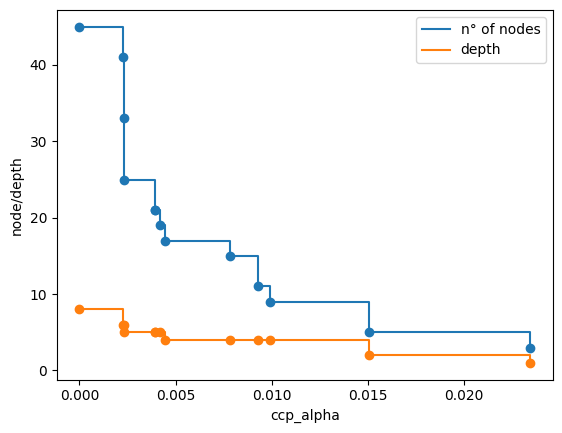

In [ ]:
# calcolo del pruning path
path_2 = clf.cost_complexity_pruning_path(X_train_2, y_train_2)
ccp_alphas_2, impurities_2 = path_2.ccp_alphas, path_2.impurities

# Creo una lista in cui andrò a storare la serie di classificatori
# per ogni ccp_alpha creo un classificatore, ci permette di controllare complessità
# e precisione del modello
clfs_2 = []
for ccp_alpha in ccp_alphas_2:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train_2, y_train_2)
    clfs_2.append(clf)

# Elimino l'ultimo perché a questo non viene applicato nessun pruning, quindi non
# lo consideriamo, così come il suo ccp_apha
clfs_2 = clfs_2[:-1]
ccp_alphas_2 = ccp_alphas_2[:-1]

node_counts = [clf.tree_.node_count for clf in clfs_2]
depth = [clf.tree_.max_depth for clf in clfs_2]

# Plotto il risultato
plt.scatter(ccp_alphas_2,node_counts)
plt.scatter(ccp_alphas_2,depth)
plt.plot(ccp_alphas_2,node_counts,label='n° of nodes',drawstyle="steps-post")
plt.plot(ccp_alphas_2,depth,label='depth',drawstyle="steps-post")
plt.xlabel('ccp_alpha')
plt.ylabel('node/depth')
plt.legend()
plt.show()

Valutiamo l'accuracy dei classificatori inseriti nella lista **clfs**; creo altre due liste che mi serviranno a plottare in un grafico le accuracy relative alla fase di **training e testing**.

Il plot finale ci aiuta quindi a ricavare il valore di ccp_alpha ottimale: il quale massimizza le prestazioni del modello sul set di test, di fatto mitigando l'overfitting.

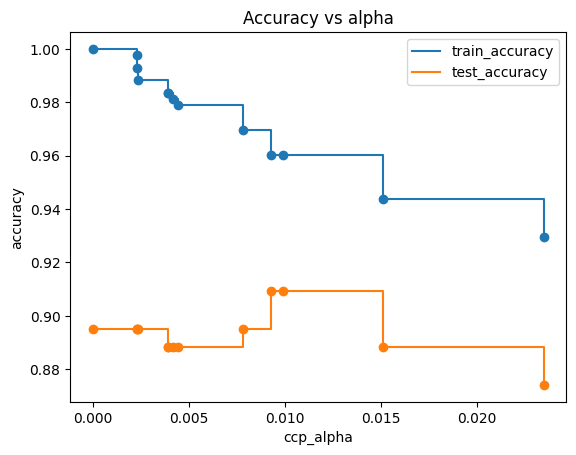

In [ ]:
# Creo due liste per la fase di "training" e la fase di "testing"
train_acc_2 = []
test_acc_2 = []

# Per ogni classificatore vado a valutare l'accuracy della fase di "training" e "testing"
for c in clfs_2:
    y_train_pred_2 = c.predict(X_train_2)
    y_test_pred_2 = c.predict(X_test_2)
    train_acc_2.append(metrics.accuracy_score(y_train_pred_2,y_train_2))
    test_acc_2.append(metrics.accuracy_score(y_test_pred_2,y_test_2))

# Plotto il risultato
plt.scatter(ccp_alphas_2,train_acc_2)
plt.scatter(ccp_alphas_2,test_acc_2)
plt.plot(ccp_alphas_2,train_acc_2,label='train_accuracy',drawstyle="steps-post")
plt.plot(ccp_alphas_2,test_acc_2,label='test_accuracy',drawstyle="steps-post")
plt.legend()
plt.title('Accuracy vs alpha')
plt.xlabel('ccp_alpha')
plt.ylabel('accuracy')
plt.show()

Una volta scelto un *alpha* che adeguato alleno nuovamente il decision tree e analizzo i risultati ottenuti.

Train score 0.9295774647887324
Test score 0.8741258741258742
Tempo di training Decision Tree: 0.01 secondi


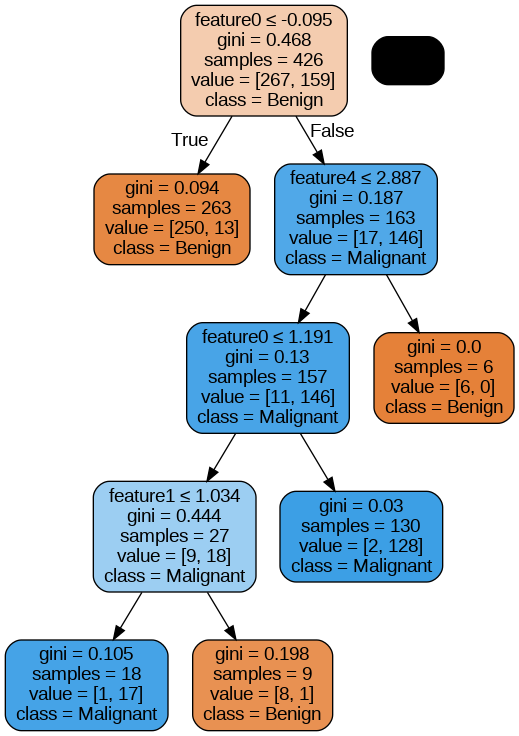

In [ ]:
start_time = time()
clf_2_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=0.010)
clf_2_.fit(X_train_2,y_train_2)
end_time = time()
y_train_pred = clf_2_.predict(X_train_2)
y_test_pred = clf_2_.predict(X_test_2)
dt_training_time = end_time - start_time

print(f'Train score {metrics.accuracy_score(y_train_pred_2,y_train_2)}')
print(f'Test score {metrics.accuracy_score(y_test_pred_2,y_test_2)}')
print(f'Tempo di training Decision Tree: {dt_training_time:.2f} secondi')


dot_data = export_graphviz(clf_2_, out_file=None,
                           feature_names=feature_names_2,
                           class_names=["Benign", "Malignant"],
                           filled=True, rounded=True, special_characters=True)

# Plotto il decision tree
graph = pydotplus.graph_from_dot_data(dot_data)
# Produco il decision tree e lo salvo in un'immagine PNG
graph.write_png('decision_tree_9F.png')
Image(graph.create_png())

*   Matrice di confusione
*   Precision
*   Recall
*   F1

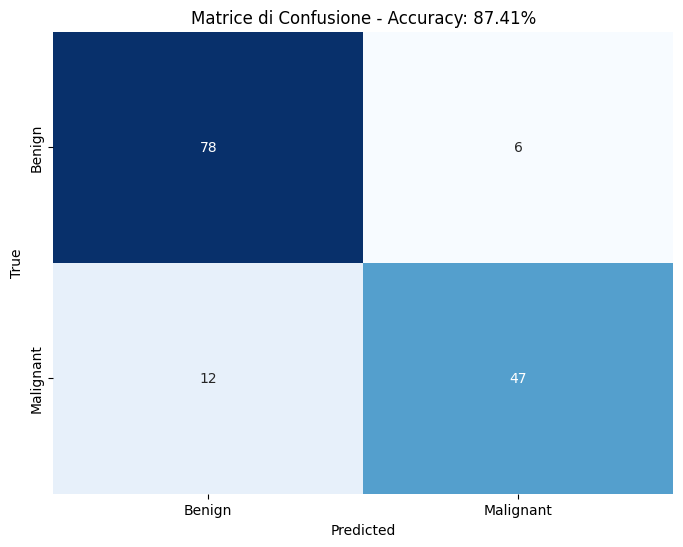

Decision tree PCA con 9 features - Precision: 0.80
Decision tree PCA con 9 features - Recall: 0.89
Decision tree PCA con 9 features - F1: 0.84
Precisione Maligna: 0.80
Precisione Benigna: 0.93
Precisione Media Macro: 0.86
Recall Maligna: 0.89
Recall Benigna: 0.87
Recall Media Macro: 0.88
Punteggio F1 Maligna: 0.84
Punteggio F1 Benigna: 0.90
Punteggio F1 Media Macro: 0.87


In [ ]:
# Creo un dataframe con la matrice di confusione
cm_2 = confusion_matrix(y_test_pred_2,y_test_2)
cm_df = pd.DataFrame(cm_2, index=["Benign", "Malignant"], columns=["Benign", "Malignant"])
accuracy = accuracy_score(y_test_2, y_test_pred_2)

# Plotto la matrice di confusione
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title(f"Matrice di Confusione - Accuracy: {accuracy*100:.2f}%")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Calcolo di Precision, Recall e F1
precision = precision_score(y_test_2, y_test_pred_2)
recall = recall_score(y_test_2, y_test_pred_2)
f1 = f1_score(y_test_2, y_test_pred_2)

# Calcolo della Precisione per ciascuna classe e media macro
precision_maligna = precision_score(y_test_2, y_test_pred_2, pos_label=1)
precision_benigna = precision_score(y_test_2, y_test_pred_2, pos_label=0)
precision_media_macro = precision_score(y_test_2, y_test_pred_2, average='macro')

# Calcolo della Recall per ciascuna classe e media macro
recall_maligna = recall_score(y_test_2, y_test_pred_2, pos_label=1)
recall_benigna = recall_score(y_test_2, y_test_pred_2, pos_label=0)
recall_media_macro = recall_score(y_test_2, y_test_pred_2, average='macro')

# Calcolo del Punteggio F1 per ciascuna classe e media macro
f1_maligna = f1_score(y_test_2, y_test_pred_2, pos_label=1)
f1_benigna = f1_score(y_test_2, y_test_pred_2, pos_label=0)
f1_media_macro = f1_score(y_test_2, y_test_pred_2, average='macro')

print(f"Decision tree PCA con 9 features - Precision: {precision:.2f}")
print(f"Decision tree PCA con 9 features - Recall: {recall:.2f}")
print(f"Decision tree PCA con 9 features - F1: {f1:.2f}")

# Stampa dei risultati
print(f"Precisione Maligna: {precision_maligna:.2f}")
print(f"Precisione Benigna: {precision_benigna:.2f}")
print(f"Precisione Media Macro: {precision_media_macro:.2f}")

print(f"Recall Maligna: {recall_maligna:.2f}")
print(f"Recall Benigna: {recall_benigna:.2f}")
print(f"Recall Media Macro: {recall_media_macro:.2f}")

print(f"Punteggio F1 Maligna: {f1_maligna:.2f}")
print(f"Punteggio F1 Benigna: {f1_benigna:.2f}")
print(f"Punteggio F1 Media Macro: {f1_media_macro:.2f}")

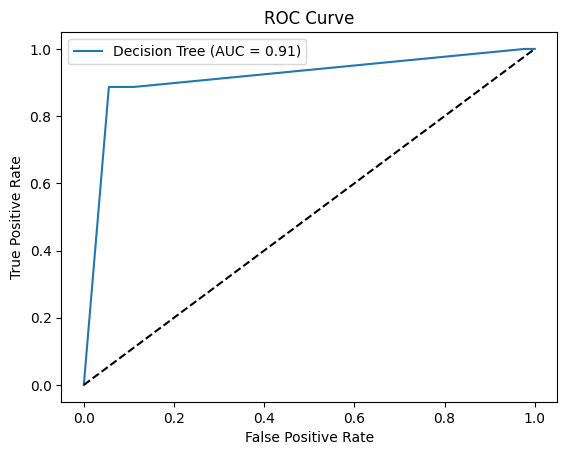

In [ ]:
y_dt_pred_prob_2 = clf_2_.predict_proba(X_test_2)[:, 1]

fpr_dt_2, tpr_dt_2, thresholds_dt_2 = roc_curve(y_test_2, y_dt_pred_prob_2)
auc_dt_2 = roc_auc_score(y_test_2, y_dt_pred_prob_2)

# Plotta la curva ROC dei due modelli per comparare le performance
plt.plot(fpr_dt_2, tpr_dt_2, label=f'Decision Tree (AUC = {auc_dt_2:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

10 cross validation e intervalli di confidenza

In [ ]:
# Preparazione dei dati
feature_names = [col for col in df.columns if col.startswith("feature")][:9]
X = df[feature_names]
y = df['diagnosis']

# Configurazione della 10-fold cross-validation
n_splits = 10
cv = KFold(n_splits=n_splits, shuffle=True, random_state=42)

accuracy_k_fold = []

# Esecuzione della cross-validation
for train_idx, valid_idx in cv.split(X, y):
    X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
    y_train, y_valid = y.iloc[train_idx], y.iloc[valid_idx]

    clf = DecisionTreeClassifier(random_state=0)
    clf.fit(X_train, y_train)

    y_pred_valid = clf.predict(X_valid)
    accuracy_k_fold.append(accuracy_score(y_valid, y_pred_valid))

# Calcolo degli intervalli di confidenza
confidence_interval = st.t.interval(confidence=0.90, df=len(accuracy_k_fold)-1, loc=np.mean(accuracy_k_fold), scale=st.sem(accuracy_k_fold))

print(f'Accuracy per fold: {accuracy_k_fold}')
print(f'Media dell\'accuracy: {np.mean(accuracy_k_fold):.4f}')
print(f'Intervallo di confidenza al 90%: {confidence_interval}')

Accuracy per fold: [0.9473684210526315, 0.9122807017543859, 0.9473684210526315, 0.9298245614035088, 0.9649122807017544, 0.8947368421052632, 0.9473684210526315, 0.9473684210526315, 0.9122807017543859, 0.9285714285714286]
Media dell'accuracy: 0.9332
Intervallo di confidenza al 90%: (0.9206912743508598, 0.9457247657493907)


## Confronto tra i decision tree

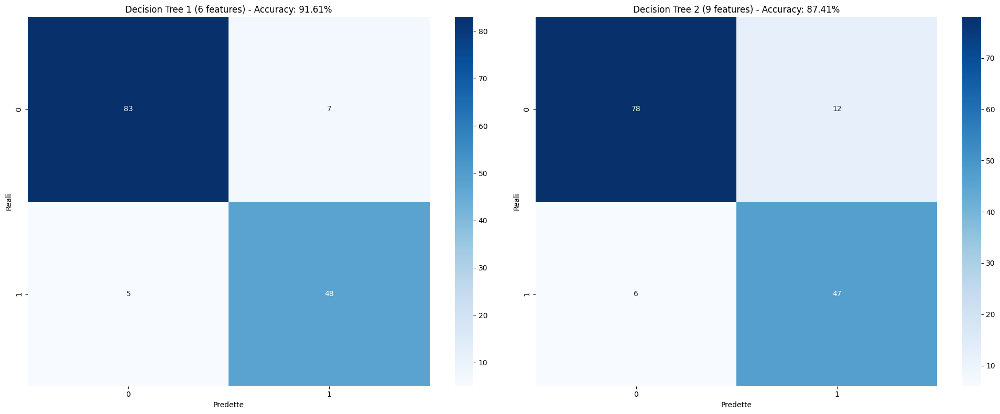

In [ ]:
# Calcolo delle matrici di confusione
cm_1 = confusion_matrix(y_test_1, y_test_pred_1)
cm_2 = confusion_matrix(y_test_2, y_test_pred_2)

# Calcolo dell'accuracy per entrambe le reti
accuracy_1 = np.trace(cm_1) / np.sum(cm_1)
accuracy_2 = np.trace(cm_2) / np.sum(cm_2)

# Creazione di una figura con due subplot
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Visualizzazione della matrice di confusione del Decision Tree 1
sns.heatmap(cm_1, annot=True, fmt='d', cmap='Blues', ax=ax[0])
ax[0].set_title(f'Decision Tree 1 (6 features) - Accuracy: {accuracy_1:.2%}')
ax[0].set_xlabel('Predette')
ax[0].set_ylabel('Reali')

# Visualizzazione della matrice di confusione del Decision Tree 2
sns.heatmap(cm_2, annot=True, fmt='d', cmap='Blues', ax=ax[1])
ax[1].set_title(f'Decision Tree 2 (9 features) - Accuracy: {accuracy_2:.2%}')
ax[1].set_xlabel('Predette')
ax[1].set_ylabel('Reali')

plt.tight_layout()
plt.show()

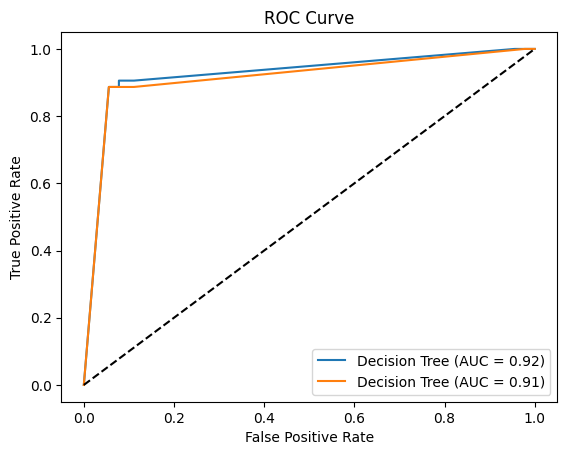

In [ ]:
y_dt_pred_prob_1 = clf_1_.predict_proba(X_test_1)[:, 1]
y_dt_pred_prob_2 = clf_2_.predict_proba(X_test_2)[:, 1]

fpr_dt_1, tpr_dt_1, thresholds_dt_1 = roc_curve(y_test_1, y_dt_pred_prob_1)
auc_dt_1 = roc_auc_score(y_test_1, y_dt_pred_prob_1)

fpr_dt_2, tpr_dt_2, thresholds_dt_2 = roc_curve(y_test_2, y_dt_pred_prob_2)
auc_dt_2 = roc_auc_score(y_test_2, y_dt_pred_prob_2)

# Plotta la curva ROC dei due modelli per comparare le performance
plt.plot(fpr_dt_1, tpr_dt_1, label=f'Decision Tree (AUC = {auc_dt_1:.2f})')
plt.plot(fpr_dt_2, tpr_dt_2, label=f'Decision Tree (AUC = {auc_dt_2:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Neural Network

Alla rete neurale sono stati applicati due versioni dello stesso dataset, ovvero quello della PCA ma con due Explained Variace differenti: per verificare quale dei due generalizza meglio i nostri dati.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from keras.models import Sequential
from keras.layers import Dense
import matplotlib.pyplot as plt
from keras.utils import plot_model
import time
from sklearn.metrics import confusion_matrix,precision_score, recall_score, f1_score
import seaborn as sns
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold,StratifiedKFold
import scipy.stats as st

## Rete neurale con 6 dimensioni (Explained Variance: 88,8%)


Epoch 1/150
13/13 [==============================] - 3s 32ms/step - loss: 0.7088 - accuracy: 0.5281 - val_loss: 0.6852 - val_accuracy: 0.5728
Epoch 2/150
13/13 [==============================] - 0s 9ms/step - loss: 0.6642 - accuracy: 0.6333 - val_loss: 0.6472 - val_accuracy: 0.6602
Epoch 3/150
13/13 [==============================] - 0s 9ms/step - loss: 0.6242 - accuracy: 0.7237 - val_loss: 0.6124 - val_accuracy: 0.7573
Epoch 4/150
13/13 [==============================] - 0s 10ms/step - loss: 0.5870 - accuracy: 0.7971 - val_loss: 0.5791 - val_accuracy: 0.8350
Epoch 5/150
13/13 [==============================] - 0s 6ms/step - loss: 0.5498 - accuracy: 0.8557 - val_loss: 0.5455 - val_accuracy: 0.8641
Epoch 6/150
13/13 [==============================] - 0s 5ms/step - loss: 0.5120 - accuracy: 0.8900 - val_loss: 0.5103 - val_accuracy: 0.8835
Epoch 7/150
13/13 [==============================] - 0s 6ms/step - loss: 0.4739 - accuracy: 0.9095 - val_loss: 0.4750 - val_accuracy: 0.9126
Epoch 8/150

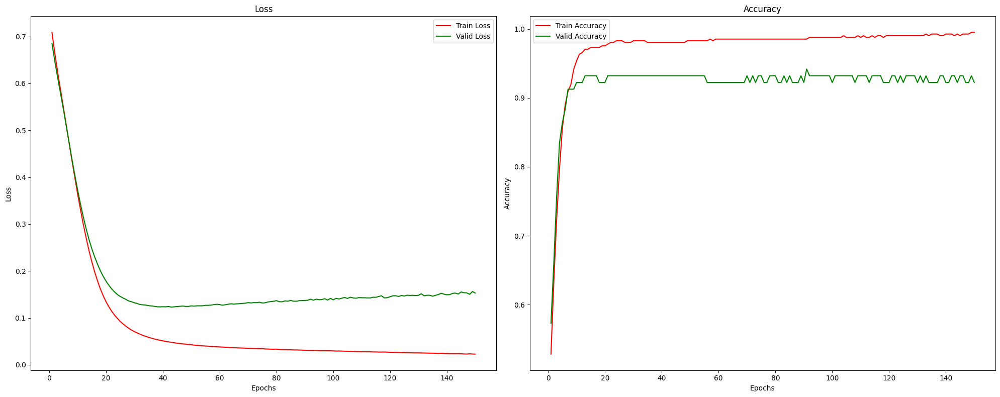

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                112       
                                                                 
 dense_1 (Dense)             (None, 8)                 136       
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 257 (1.00 KB)
Trainable params: 257 (1.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Tempo di addestramento: 21.21 secondi


In [ ]:
X = bc_dataframe_PCA[['feature0', 'feature1', 'feature2', 'feature3', 'feature4', 'feature5']].values
y = bc_dataframe_PCA['diagnosis'].values

# Standardizzazione dei dati
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Encoding delle etichette
encoder = LabelEncoder()
y = encoder.fit_transform(y)

# Divisione del dataset in training set e test set
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X, y, train_size=0.9, shuffle=True, random_state=42)

# Definizione del modello di rete neurale
model_1 = Sequential([
    Dense(16, activation='relu', input_dim=6),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Addestramento del modello
start_time = time.time()
history = model_1.fit(X_train_1, y_train_1, epochs=150, validation_split=0.2)
end_time = time.time()
training_time = end_time - start_time

# Visualizzazione dei risultati
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(tr_acc) + 1)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, 'r', label='Train Loss')
plt.plot(epochs, val_loss, 'g', label='Valid Loss')
plt.title('Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, 'r', label='Train Accuracy')
plt.plot(epochs, val_acc, 'g', label='Valid Accuracy')
plt.title('Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()

model_1.summary()
plot_model(model_1, show_shapes=True, to_file='Model_PCA_6_Features.png')

print(f'Tempo di addestramento: {training_time:.2f} secondi')

Training della rete e valutiamo le performance

In [ ]:
score = model_1.evaluate(X_test_1, y_test_1, verbose=0)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.12953920662403107
Test accuracy: 0.9649122953414917


In [ ]:
# Salviamo i pesi del modello in formato HDF5
model_1.save_weights("model.h5")
print("Saved model to disk")

# Salviamo l'architettura del modello in formato JSON
model_json = model_1.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)


Saved model to disk


Matrice confusione

2/2 [==============================] - 0s 4ms/step


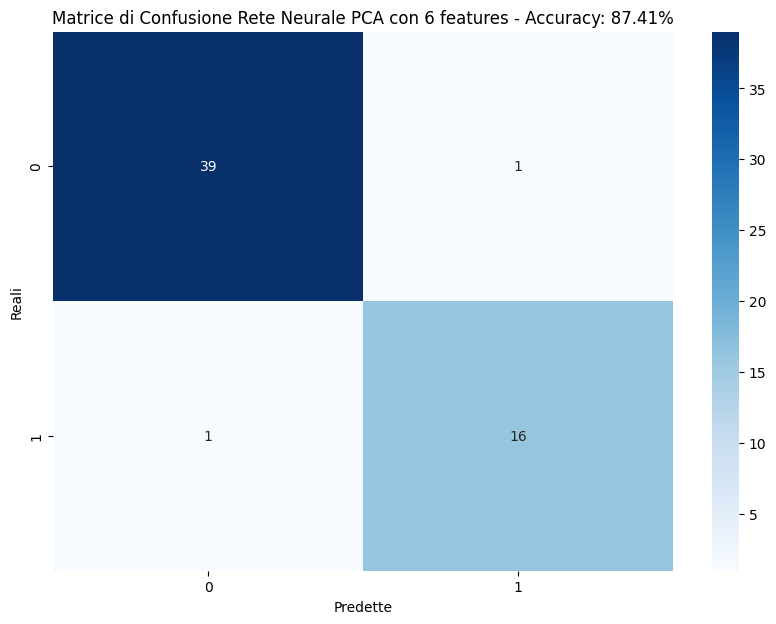

In [ ]:
# Predizione sui dati di test
y_pred_1 = (model_1.predict(X_test_1) > 0.5).astype("int32")

# Calcolo della matrice di confusione per la Rete Neurale 2
cm_1 = confusion_matrix(y_test_1, y_pred_1)

# Calcolo dell'accuracy per la Rete Neurale 2
accuracy_1 = np.trace(cm_1) / np.sum(cm_1)

# Visualizzazione della matrice di confusione per la Rete Neurale 2
plt.figure(figsize=(10, 7))
sns.heatmap(cm_1, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matrice di Confusione Rete Neurale PCA con 6 features - Accuracy: {accuracy_2:.2%}')
plt.xlabel('Predette')
plt.ylabel('Reali')
plt.show()


Precision,Recall e F1

In [ ]:
# Calcolo di Precision, Recall e F1
precision_1 = precision_score(y_test_1, y_pred_1)
recall_1 = recall_score(y_test_1, y_pred_1)
f1_1 = f1_score(y_test_1, y_pred_1)

print(f"Rete Neurale PCA con 6 features - Precision: {precision_1:.2f}")
print(f"Rete Neurale PCA con 6 features - Recall: {recall_1:.2f}")
print(f"Rete Neurale PCA con 6 features - F1: {f1_1:.2f}")

# Calcolo della Precisione per ciascuna classe e media macro
precision_malignant_1 = precision_score(y_test_1, y_pred_1, pos_label=1)
precision_benign_1 = precision_score(y_test_1, y_pred_1, pos_label=0)
precision_macro_1 = precision_score(y_test_1, y_pred_1, average='macro')

# Calcolo della Recall per ciascuna classe e media macro
recall_malignant_1 = recall_score(y_test_1, y_pred_1, pos_label=1)
recall_benign_1 = recall_score(y_test_1, y_pred_1, pos_label=0)
recall_macro_1 = recall_score(y_test_1, y_pred_1, average='macro')

# Calcolo del Punteggio F1 per ciascuna classe e media macro
f1_malignant_1 = f1_score(y_test_1, y_pred_1, pos_label=1)
f1_benign_1 = f1_score(y_test_1, y_pred_1, pos_label=0)
f1_macro_1 = f1_score(y_test_1, y_pred_1, average='macro')

# Stampa dei risultati
print(f"Precisione Maligna: {precision_malignant_1:.2f}")
print(f"Precisione Benigna: {precision_benign_1:.2f}")
print(f"Precisione Media Macro: {precision_macro_1:.2f}")

print(f"Recall Maligna: {recall_malignant_1:.2f}")
print(f"Recall Benigna: {recall_benign_1:.2f}")
print(f"Recall Media Macro: {recall_macro_1:.2f}")

print(f"Punteggio F1 Maligna: {f1_malignant_1:.2f}")
print(f"Punteggio F1 Benigna: {f1_benign_1:.2f}")
print(f"Punteggio F1 Media Macro: {f1_macro_1:.2f}")

Rete Neurale PCA con 6 features - Precision: 0.94
Rete Neurale PCA con 6 features - Recall: 0.94
Rete Neurale PCA con 6 features - F1: 0.94
Precisione Maligna: 0.94
Precisione Benigna: 0.97
Precisione Media Macro: 0.96
Recall Maligna: 0.94
Recall Benigna: 0.97
Recall Media Macro: 0.96
Punteggio F1 Maligna: 0.94
Punteggio F1 Benigna: 0.97
Punteggio F1 Media Macro: 0.96


Curva AUC ROC **Rete neurale con 6 features**

2/2 [==============================] - 0s 4ms/step


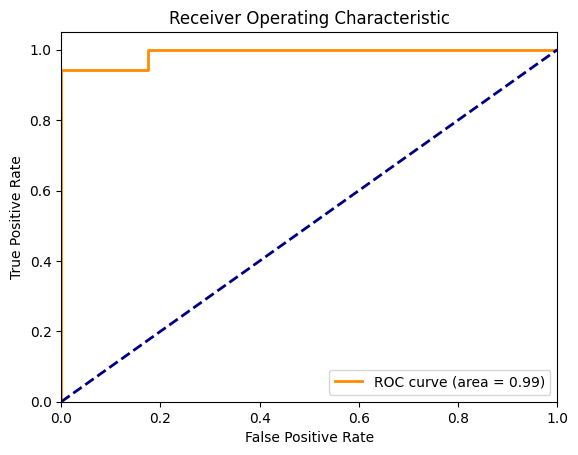

In [ ]:
# Predizione delle probabilità per il test set
y_pred_probs_1 = model_1.predict(X_test_1)

# Calcolo della curva ROC
fpr_1, tpr_1, thresholds_1 = roc_curve(y_test_1, y_pred_probs_1)

# Calcolo dell'AUC
roc_auc_1 = auc(fpr_1, tpr_1)

# Visualizzazione della curva ROC
plt.figure()
plt.plot(fpr_1, tpr_1, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_1)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

10 cross validation e intervalli di confidenza

In [ ]:
X = bc_dataframe_PCA[['feature0', 'feature1', 'feature2', 'feature3', 'feature4', 'feature5']].values
y = bc_dataframe_PCA['diagnosis'].values

# Standardizzazione dei dati
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Encoding delle etichette
encoder = LabelEncoder()
y = encoder.fit_transform(y)

# Configurazione della cross-validation
n_fold = 10
folds = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=42)
accuracy_k_fold = []

# Cross-validation
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(X, y)):
    X_train, X_valid = X[train_idx], X[valid_idx]
    y_train, y_valid = y[train_idx], y[valid_idx]

    # Definizione del modello di rete neurale
    model = Sequential([
        Dense(16, activation='relu', input_dim=6),
        Dense(8, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Addestramento del modello
    model.fit(X_train, y_train, epochs=150, verbose=0)  # Impostare verbose=0 per non stampare l'output dell'addestramento

    # Valutazione del modello
    y_pred_valid = (model.predict(X_valid) > 0.5).astype("int32")
    accuracy_k_fold.append(accuracy_score(y_valid, y_pred_valid))

# Stampa delle accuracy per ogni fold
print(accuracy_k_fold)

# Calcolo dell'intervallo di confidenza
confidence_interval = st.t.interval(confidence=0.90, df=len(accuracy_k_fold)-1, loc=np.mean(accuracy_k_fold), scale=st.sem(accuracy_k_fold))
print(f"Intervallo di confidenza al 90%: {confidence_interval}")

2/2 [==============================] - 0s 5ms/step


2/2 [==============================] - 0s 6ms/step


2/2 [==============================] - 0s 4ms/step
[0.9649122807017544, 1.0, 0.9824561403508771, 0.9824561403508771, 0.9824561403508771, 0.9649122807017544, 1.0, 0.9122807017543859, 0.9824561403508771, 1.0]
Intervallo di confidenza al 90%: (0.9619948179968064, 0.9923911469154741)


## Rete neurale con 9 dimensioni (Explained Variance: 94,1%)


Epoch 1/150
13/13 [==============================] - 1s 18ms/step - loss: 0.6530 - accuracy: 0.6186 - val_loss: 0.6267 - val_accuracy: 0.6311
Epoch 2/150
13/13 [==============================] - 0s 6ms/step - loss: 0.6195 - accuracy: 0.6381 - val_loss: 0.6060 - val_accuracy: 0.6311
Epoch 3/150
13/13 [==============================] - 0s 6ms/step - loss: 0.5884 - accuracy: 0.6675 - val_loss: 0.5872 - val_accuracy: 0.6699
Epoch 4/150
13/13 [==============================] - 0s 6ms/step - loss: 0.5604 - accuracy: 0.7017 - val_loss: 0.5652 - val_accuracy: 0.6796
Epoch 5/150
13/13 [==============================] - 0s 6ms/step - loss: 0.5329 - accuracy: 0.7408 - val_loss: 0.5424 - val_accuracy: 0.6990
Epoch 6/150
13/13 [==============================] - 0s 6ms/step - loss: 0.5057 - accuracy: 0.7555 - val_loss: 0.5174 - val_accuracy: 0.7282
Epoch 7/150
13/13 [==============================] - 0s 6ms/step - loss: 0.4768 - accuracy: 0.7800 - val_loss: 0.4928 - val_accuracy: 0.7476
Epoch 8/150


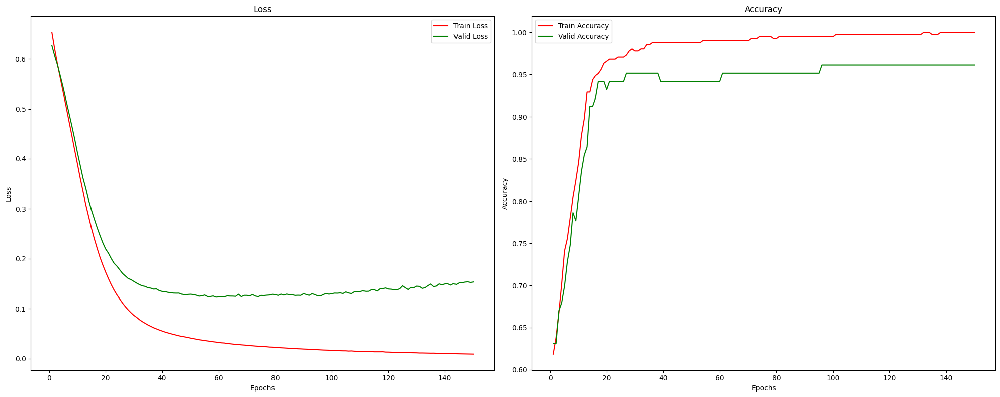

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_33 (Dense)            (None, 16)                160       
                                                                 
 dense_34 (Dense)            (None, 8)                 136       
                                                                 
 dense_35 (Dense)            (None, 1)                 9         
                                                                 
Total params: 305 (1.19 KB)
Trainable params: 305 (1.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Tempo di addestramento: 14.63 secondi


In [ ]:
X = bc_dataframe_PCA[['feature0', 'feature1', 'feature2', 'feature3','feature4','feature5','feature6','feature7','feature8']].values
y = bc_dataframe_PCA['diagnosis'].values

# Standardizzazione dei dati
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Encoding delle etichette
encoder = LabelEncoder()
y = encoder.fit_transform(y)

# Divisione del dataset in training set e test set
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X, y, train_size=0.9, shuffle=True, random_state=42)

# Definizione del modello di rete neurale
model_2 = Sequential([
    Dense(16, activation='relu', input_dim=9),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Addestramento del modello
start_time = time.time()
history = model_2.fit(X_train_2, y_train_2, epochs=150, validation_split=0.2)
end_time = time.time()
training_time = end_time - start_time

# Visualizzazione dei risultati
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(tr_acc) + 1)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, 'r', label='Train Loss')
plt.plot(epochs, val_loss, 'g', label='Valid Loss')
plt.title('Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, 'r', label='Train Accuracy')
plt.plot(epochs, val_acc, 'g', label='Valid Accuracy')
plt.title('Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()

model_2.summary()

plot_model(model_2, show_shapes=True, to_file='Model_PCA_9_Features.png')

print(f'Tempo di addestramento: {training_time:.2f} secondi')

valutiamo le performance



In [ ]:
score = model_2.evaluate(X_test_2, y_test_2, verbose=0)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.11273256689310074
Test accuracy: 0.9649122953414917


In [ ]:
# Salviamo i pesi del modello in formato HDF5
model_2.save_weights("model.h5")
print("Saved model to disk")

# Salviamo l'architettura del modello in formato JSON
model_json = model_2.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)


Saved model to disk


2/2 [==============================] - 0s 4ms/step


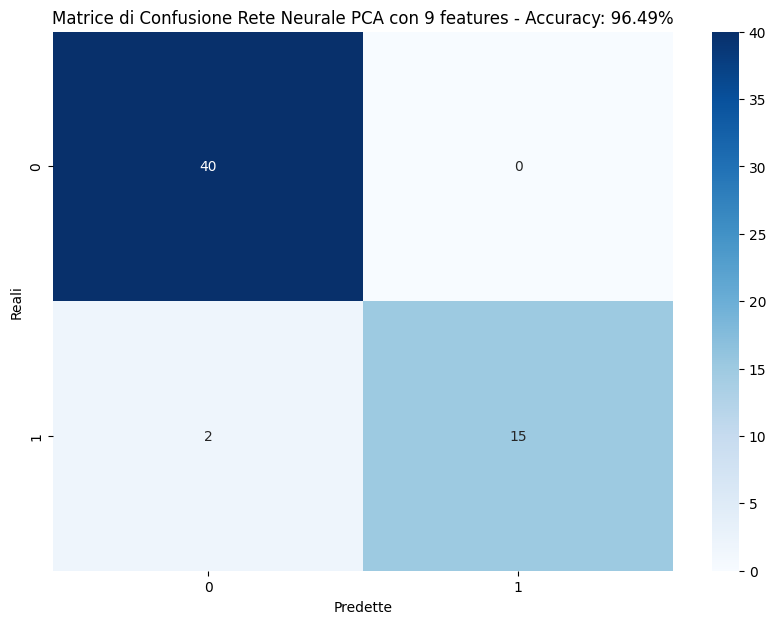

In [ ]:
# Predizione sui dati di test
y_pred_2 = (model_2.predict(X_test_2) > 0.5).astype("int32")

# Calcolo della matrice di confusione per la Rete Neurale 1
cm_2 = confusion_matrix(y_test_2, y_pred_2)

# Calcolo dell'accuracy per la Rete Neurale 1
accuracy_2 = np.trace(cm_2) / np.sum(cm_2)

# Visualizzazione della matrice di confusione per la Rete Neurale 1
plt.figure(figsize=(10, 7))
sns.heatmap(cm_2, annot=True, fmt='d', cmap='Blues')
plt.title(f'Matrice di Confusione Rete Neurale PCA con 9 features - Accuracy: {accuracy_1:.2%}')
plt.xlabel('Predette')
plt.ylabel('Reali')
plt.show()


Precision,Recall e F1

In [ ]:
# Calcolo di Precision, Recall e F1
precision_2 = precision_score(y_test_2, y_pred_2)
recall_2 = recall_score(y_test_2, y_pred_2)
f1_2 = f1_score(y_test_2, y_pred_2)

print(f"Rete Neurale PCA con 9 features - Precision: {precision_2:.2f}")
print(f"Rete Neurale PCA con 9 features - Recall: {recall_2:.2f}")
print(f"Rete Neurale PCA con 9 features - F1: {f1_2:.2f}")

# Calcolo della Precisione per ciascuna classe e media macro
precision_maligna_2 = precision_score(y_test_2, y_pred_2, pos_label=1)
precision_benigna_2 = precision_score(y_test_2, y_pred_2, pos_label=0)
precision_media_macro_2 = precision_score(y_test_2, y_pred_2, average='macro')

# Calcolo della Recall per ciascuna classe e media macro
recall_maligna_2 = recall_score(y_test_2, y_pred_2, pos_label=1)
recall_benigna_2 = recall_score(y_test_2, y_pred_2, pos_label=0)
recall_media_macro_2 = recall_score(y_test_2, y_pred_2, average='macro')

# Calcolo del Punteggio F1 per ciascuna classe e media macro
f1_maligna_2 = f1_score(y_test_2, y_pred_2, pos_label=1)
f1_benigna_2 = f1_score(y_test_2, y_pred_2, pos_label=0)
f1_media_macro_2 = f1_score(y_test_2, y_pred_2, average='macro')

# Stampa dei risultati
print(f"Precisione Maligna: {precision_maligna_2:.2f}")
print(f"Precisione Benigna: {precision_benigna_2:.2f}")
print(f"Precisione Media Macro: {precision_media_macro_2:.2f}")

print(f"Recall Maligna: {recall_maligna_2:.2f}")
print(f"Recall Benigna: {recall_benigna_2:.2f}")
print(f"Recall Media Macro: {recall_media_macro_2:.2f}")

print(f"Punteggio F1 Maligna: {f1_maligna_2:.2f}")
print(f"Punteggio F1 Benigna: {f1_benigna_2:.2f}")
print(f"Punteggio F1 Media Macro: {f1_media_macro_2:.2f}")

Rete Neurale PCA con 9 features - Precision: 1.00
Rete Neurale PCA con 9 features - Recall: 0.88
Rete Neurale PCA con 9 features - F1: 0.94
Precisione Maligna: 1.00
Precisione Benigna: 0.95
Precisione Media Macro: 0.98
Recall Maligna: 0.88
Recall Benigna: 1.00
Recall Media Macro: 0.94
Punteggio F1 Maligna: 0.94
Punteggio F1 Benigna: 0.98
Punteggio F1 Media Macro: 0.96


Confronto delle Matrice di confusione tra le 2 reti neurali

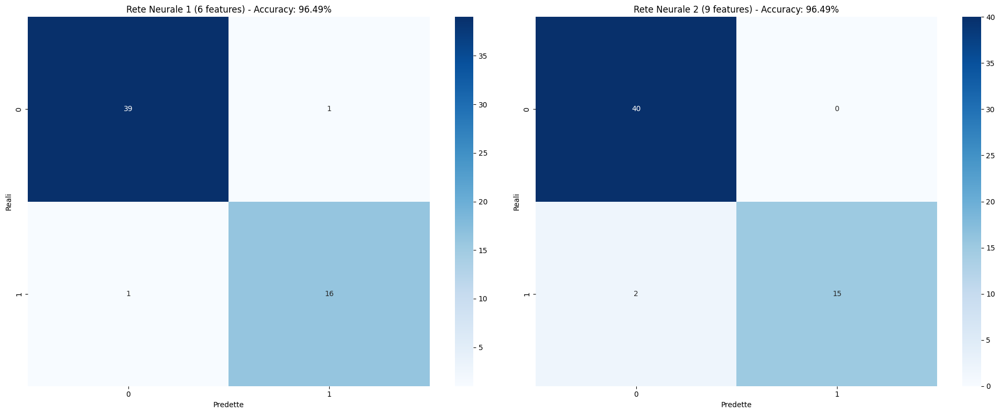

In [ ]:
# Calcolo delle matrici di confusione
cm_1 = confusion_matrix(y_test_1, y_pred_1)
cm_2 = confusion_matrix(y_test_2, y_pred_2)

# Calcolo dell'accuracy per entrambe le reti
accuracy_1 = np.trace(cm_1) / np.sum(cm_1)
accuracy_2 = np.trace(cm_2) / np.sum(cm_2)

# Creazione di una figura con due subplot
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Visualizzazione della matrice di confusione della Rete Neurale 1
sns.heatmap(cm_1, annot=True, fmt='d', cmap='Blues', ax=ax[0])
ax[0].set_title(f'Rete Neurale 1 (6 features) - Accuracy: {accuracy_1:.2%}')
ax[0].set_xlabel('Predette')
ax[0].set_ylabel('Reali')

# Visualizzazione della matrice di confusione della Rete Neurale 2
sns.heatmap(cm_2, annot=True, fmt='d', cmap='Blues', ax=ax[1])
ax[1].set_title(f'Rete Neurale 2 (9 features) - Accuracy: {accuracy_2:.2%}')
ax[1].set_xlabel('Predette')
ax[1].set_ylabel('Reali')

plt.tight_layout()
plt.show()

Curva AUC ROC **Rete neurale con 9 features**

2/2 [==============================] - 0s 5ms/step


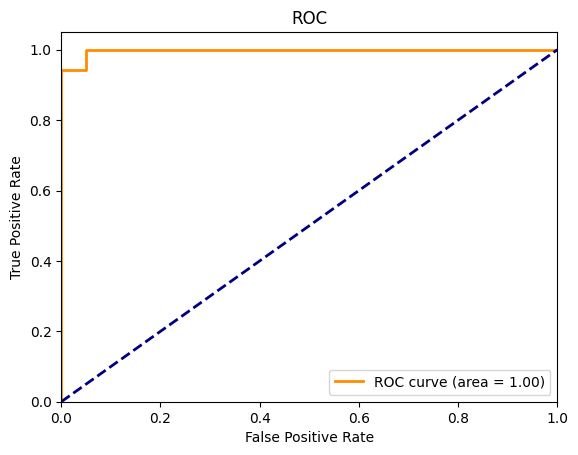

In [ ]:
# Predizione delle probabilità per il test set
y_pred_probs_2 = model_2.predict(X_test_2)

# Calcolo della curva ROC
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test_2, y_pred_probs_2)

# Calcolo dell'AUC
roc_auc_2 = auc(fpr_2, tpr_2)

# Visualizzazione della curva ROC
plt.figure()
plt.plot(fpr_2, tpr_2, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

10 cross validation e intervalli di confidenza

In [ ]:
X = bc_dataframe_PCA[['feature0', 'feature1', 'feature2', 'feature3','feature4','feature5','feature6','feature7','feature8']].values
y = bc_dataframe_PCA['diagnosis'].values

# Standardizzazione dei dati
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Encoding delle etichette
encoder = LabelEncoder()
y = encoder.fit_transform(y)

# Configurazione della cross-validation
n_fold = 10
folds = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=42)
accuracy_k_fold = []

# Cross-validation
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(X, y)):
    X_train, X_valid = X[train_idx], X[valid_idx]
    y_train, y_valid = y[train_idx], y[valid_idx]

    # Definizione del modello di rete neurale
    model = Sequential([
        Dense(16, activation='relu', input_dim=9),
        Dense(8, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Addestramento del modello
    model.fit(X_train, y_train, epochs=150, verbose=0)  # Impostare verbose=0 per non stampare l'output dell'addestramento

    # Valutazione del modello
    y_pred_valid = (model.predict(X_valid) > 0.5).astype("int32")
    accuracy_k_fold.append(accuracy_score(y_valid, y_pred_valid))

# Stampa delle accuracy per ogni fold
print(accuracy_k_fold)

# Calcolo dell'intervallo di confidenza
confidence_interval = st.t.interval(confidence=0.90, df=len(accuracy_k_fold)-1, loc=np.mean(accuracy_k_fold), scale=st.sem(accuracy_k_fold))
print(f"Intervallo di confidenza al 90%: {confidence_interval}")

2/2 [==============================] - 0s 8ms/step
[0.9649122807017544, 0.9824561403508771, 0.9824561403508771, 0.9473684210526315, 0.9824561403508771, 0.9122807017543859, 1.0, 0.9298245614035088, 0.9824561403508771, 0.9821428571428571]
Intervallo di confidenza al 90%: (0.9504243844221666, 0.9828462922695628)


Confronto curva AUC ROC tra i 2 modelli 6 features

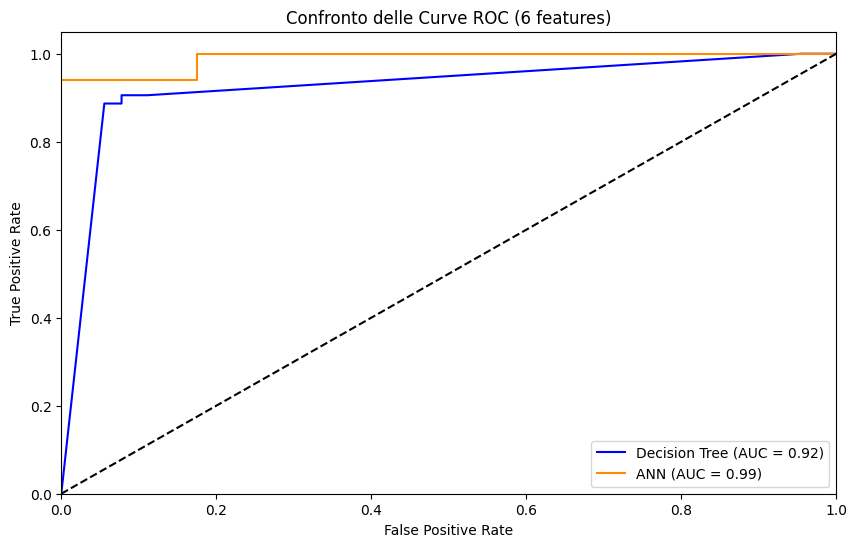

In [ ]:
# Plottaggio delle curve ROC (6 features)
plt.figure(figsize=(10, 6))
plt.plot(fpr_dt_1, tpr_dt_1, label=f'Decision Tree (AUC = {auc_dt_1:.2f})', color='blue')
plt.plot(fpr_1, tpr_1, label=f'ANN (AUC = {roc_auc_1:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], 'k--')  # Linea diagonale per un classificatore casuale
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Confronto delle Curve ROC (6 features)')
plt.legend(loc="lower right")
plt.show()

Confronto curva AUC ROC tra i 2 modelli 9 features

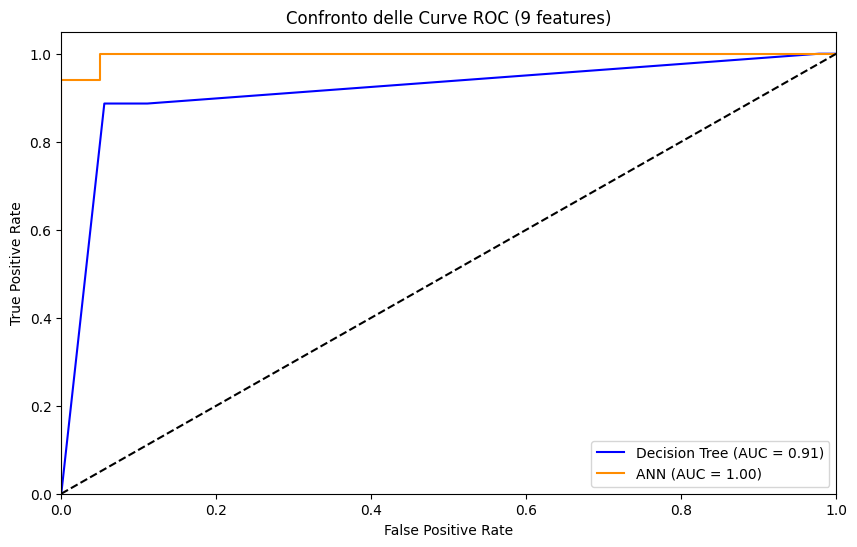

In [ ]:
# Plottaggio delle curve ROC (9 features)
plt.figure(figsize=(10, 6))
plt.plot(fpr_dt_2, tpr_dt_2, label=f'Decision Tree (AUC = {auc_dt_2:.2f})', color='blue')
plt.plot(fpr_2, tpr_2, label=f'ANN (AUC = {roc_auc_2:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], 'k--')  # Linea diagonale per un classificatore casuale
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Confronto delle Curve ROC (9 features)')
plt.legend(loc="lower right")
plt.show()